In [280]:
from astroquery.sdss import SDSS
from astropy.io import fits
import csv
from astropy.coordinates import match_coordinates_sky
import astropy.units as u
from astropy.coordinates import SkyCoord
import matplotlib.pyplot as plt
import numpy as np
from specutils import Spectrum1D
from labellines import labelLines
import matplotlib.axes as axes
import pandas as pd
import seaborn as sns
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset
from PIL import Image
from fpdf import FPDF

plt.rcParams['agg.path.chunksize'] = 120

In [8]:
eboss_fits = fits.open('eboss_dr17_summary_edapv10_cigale.fit', memmap=True)

eboss_data = eboss_fits[1].data
eboss_fits.info()
print(eboss_fits[1].columns)

Filename: eboss_dr17_summary_edapv10_cigale.fit
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1                1 BinTableHDU    235   1898753R x 109C   ['J', 'J', 'J', '16A', 'D', 'E', 'D', 'D', 'E', '118A', '4A', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', '9A', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', '8E', '8E', '8E', '8E', '5E', '5E', '5E', '5E', 'E', 'E', 'A', 'A', 'A', 'I', 'I', 'I']   
ColDefs(
    name = 'PLATE'; format = 'J'
    name = 'MJD'; format = 'J'
    name = 'FIBER'; format = 'J'
    name = 'PMF_STRING'; format = '16A'
    name = 'Z'; format = 'D'
    name = 'Z_ERR'; format = 'E'
    nam

In [96]:
gals_flux = eboss_data[(eboss_data['NII_6584_FLUX_ERR']>0)]

err_range = 3

# Make sure relavent emission lines have well measured fluxes
quality_gals = gals_flux[((gals_flux['H_ALPHA_FLUX']/gals_flux['H_ALPHA_FLUX_ERR'])>err_range) &
                (((gals_flux['NII_6584_FLUX']/gals_flux['NII_6584_FLUX_ERR'])>err_range) | (gals_flux["H_GAMMA_EW"]>10)) & 
                (gals_flux['Z']<0.15)] #signal to noise ratio filter

cut_gals = quality_gals[(np.log10(quality_gals['NII_6584_FLUX']/quality_gals['H_ALPHA_FLUX'])<(-1.5))]
print(len(cut_gals))

1286


C:\Users\nihad\AppData\Local\Temp\ipykernel_38188\3370471796.py:10: RuntimeWarning: divide by zero encountered in log10
  cut_gals = quality_gals[(np.log10(quality_gals['NII_6584_FLUX']/quality_gals['H_ALPHA_FLUX'])<(-1.5))]


In [228]:
#known IMBH host:
ra = 28.29985833
dec = 1.07783056
error = 0.0001
samp_gal = cut_gals[(abs(cut_gals['RA']-ra) <error) & (abs(cut_gals['DEC']-dec)<error)]
print(len(samp_gal))
print(samp_gal)

1
[(4233, 55449, 623, '04233-55449-0623', 0.06323096, 2.1188416e-05, 28.29982891, 1.07781419, 0.02518772, 'QSO_FIRST_BOSS', 'BQSO', 0., 0., -999., 0., -999., 68.28789, 1.5199559, 67.28023, 0.8215381, -1998., 997002., -1998., 0., 4.9802246, 0., 27.212383, 2.157977, 24.663956, 41.29961, 1.5660213, 40.80584, 28.24997, 1.5035641, 42.11435, 57.09516, 1.6260141, 83.70546, 122.221054, 3.2392576, 231.334, 68.28789, 1.5199559, 16.36245, 1.0819238, 27.835726, 3.023424, 1.1370574, 5.253297, 173.24612, 3.656702, 181.13112, 523.40216, 11.047439, 494.36414, 2.6136289, 0.98828244, 5.719242, 389.15616, 9.649732, 1169.6334, 1.6248753, 0.9567359, 4.9250917, 2.27495, 0.68945163, 7.2957273, 2.6827836, 0.96519566, 9.790791, 0.98862135, 0.08803129, 3.208485, 3.9351907, 1.2150378, 0.2466815, 0.6316895, -999., 'DECALS', 7.0432763, 0.02171472, -1.5057775, 0.02171472, 8.340931e-05, 0.00090947, 9997.241, 117.41998, 1000., 1.1368684e-13, 6.818156e-35, 2.4647468e-18, 3.8261253e-35, 1.3831351e-18, [0.00713183, 0.00

SDSS Spectrum: Plate=[4233], MJD=[55449], Fiber=[623]


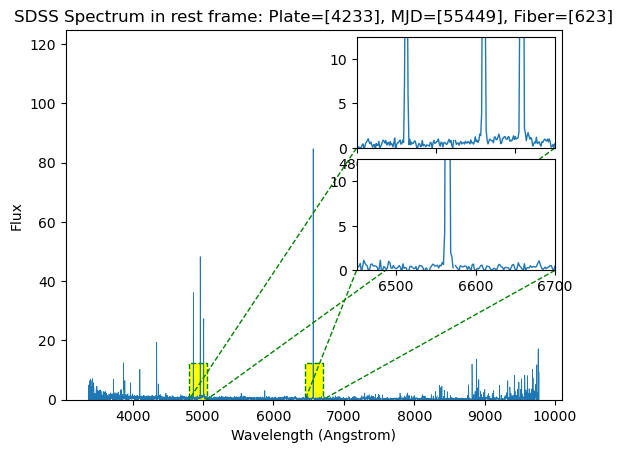

In [238]:
plate = samp_gal["PLATE"]
mjd = samp_gal["MJD"]
fiber = samp_gal["FIBER"]

print(f"SDSS Spectrum: Plate={plate}, MJD={mjd}, Fiber={fiber}")


sp = SDSS.get_spectra(plate=plate, mjd=mjd, fiberID=fiber)

spec_hdu = sp[0]
spec_data = spec_hdu[1].data

z = spec_hdu[2].data["z"]

header = spec_hdu[0].header

loglam = spec_data['loglam']
flux = spec_data['flux']
wavelength = 10**loglam

fig, ax = plt.subplots()

#plot the spectrum
plt.plot(wavelength/(1+z), flux, linewidth=0.5)
plt.xlabel("Wavelength (Angstrom)")
plt.ylabel("Flux")
y_top = max(flux) + 40
plt.ylim(0,y_top)
plt.title(f"SDSS Spectrum in rest frame: Plate={plate}, MJD={mjd}, Fiber={fiber}")

#inset plot
inset1 = inset_axes(ax, width='40%', height='30%', loc='upper right',)
inset1.plot(wavelength/(1+z), flux, linewidth=1)
inset1.set_xlim(4800, 5050)
inset1.set_ylim(0, y_top/10)
mark_inset(ax, inset1, loc1=3, loc2=4, fc='yellow', ec='g', ls='--')

#inset plot
inset2 = inset_axes(ax, width='40%', height='30%', loc='center right',)
inset2.plot(wavelength/(1+z), flux, linewidth=1)
inset2.set_xlim(6450, 6700)
inset2.set_ylim(0, y_top/10)
mark_inset(ax, inset2, loc1=3, loc2=4, fc='yellow', ec='g', ls='--')

plt.savefig(str(samp_gal["PLATE"][0]) + "-" + str(samp_gal["MJD"][0])+ "-"+ str(samp_gal["FIBER"][0])+".jpeg")

plt.show()

In [218]:
#FIRST Survey Match:
ra = 214.85086864
dec = 28.10771986
error = 0.0001
samp_gal = cut_gals[(abs(cut_gals['RA']-ra) <error) & (abs(cut_gals['DEC']-dec)<error)]
print(len(samp_gal))
print(samp_gal)

1
[(6012, 56101, 730, '06012-56101-0730', 0.12631892, 1.24591525e-05, 214.85086864, 28.10771986, 0.01553608, 'QSO_FIRST_BOSS QSO_BONUS_MAIN', 'BQSO', 0., 37925.88, -999., 0., -999., 74.13069, 2.6801813, 71.4271, 0.96282655, -1998., 997002., -1998., 1.3700303, 1.3050046, 1.0775898, 52.520287, 2.2636273, 39.390377, 14.694005, 1.7645296, 12.194253, 10.492305, 1.0424803, 10.257606, 19.296713, 1.0968344, 26.44104, 46.463512, 1.5135684, 106.03281, 74.13069, 2.6801813, 4.0640297, 0.8470733, 5.0359488, 0., 0.90894645, 0., 58.82092, 0.9067662, 106.8336, 177.7067, 2.739475, 317.30365, 0.71230966, 0.74454415, 1.6083407, 123.20622, 2.4103436, 343.55618, 2.834619, 0.75869614, 8.269328, 2.6803958, 0.593536, 10.590545, 3.8303914, 0.7101202, 15.891811, 1.0329864, 0.06693175, 2.8082685, 2.8400455, 1.068207, 0.07043678, 0.5825918, -1.6381379, 'DECALS', 7.756297, 0.04448005, -0.85886824, 0.06974562, 0.11796328, 0.08162069, 5550.279, 3342.7427, 1043.2354, 669.5217, 0.00046535, 0.0064281, 0.00026114, 0.003

SDSS Spectrum: Plate=[4233], MJD=[55449], Fiber=[623]


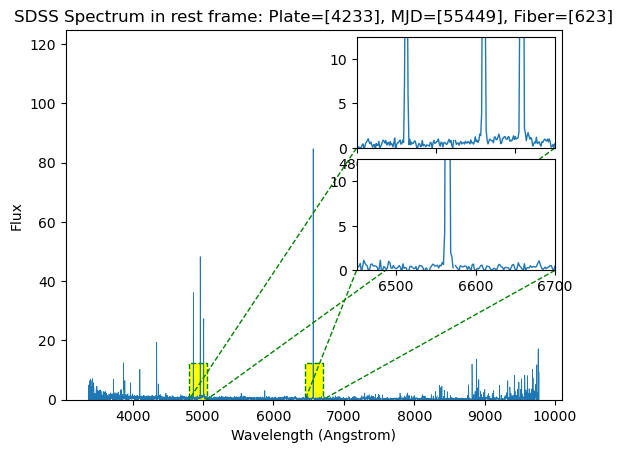

In [242]:
plate = samp_gal["PLATE"]
mjd = samp_gal["MJD"]
fiber = samp_gal["FIBER"]

print(f"SDSS Spectrum: Plate={plate}, MJD={mjd}, Fiber={fiber}")


sp = SDSS.get_spectra(plate=plate, mjd=mjd, fiberID=fiber)

spec_hdu = sp[0]
spec_data = spec_hdu[1].data

z = spec_hdu[2].data["z"]

header = spec_hdu[0].header

loglam = spec_data['loglam']
flux = spec_data['flux']
wavelength = 10**loglam

fig, ax = plt.subplots()

#plot the spectrum
plt.plot(wavelength/(1+z), flux, linewidth=0.5)
plt.xlabel("Wavelength (Angstrom)")
plt.ylabel("Flux")
y_top = max(flux) + 40
plt.ylim(0,y_top)
plt.title(f"SDSS Spectrum in rest frame: Plate={plate}, MJD={mjd}, Fiber={fiber}")


#inset plot
inset1 = inset_axes(ax, width='40%', height='30%', loc='upper right',)
inset1.plot(wavelength/(1+z), flux, linewidth=1)
inset1.set_xlim(4800, 5050)
inset1.set_ylim(0, y_top/10)
mark_inset(ax, inset1, loc1=3, loc2=4, fc='yellow', ec='g', ls='--')

#inset plot
inset2 = inset_axes(ax, width='40%', height='30%', loc='center right',)
inset2.plot(wavelength/(1+z), flux, linewidth=1)
inset2.set_xlim(6450, 6700)
inset2.set_ylim(0, y_top/10)
mark_inset(ax, inset2, loc1=3, loc2=4, fc='yellow', ec='g', ls='--')

plt.savefig(str(samp_gal["PLATE"][0]) + "-" + str(samp_gal["MJD"][0])+ "-"+ str(samp_gal["FIBER"][0])+".jpeg")

plt.show()

In [308]:
#LoTSS Survey Matchs:
LoTSS_match = [( 28.29982891,  1.07781419), (214.85086864, 28.10771986),
               (183.30780513, 39.94642162), (4.48175936, 18.87210016),
               (164.51733577, 51.81236532), (231.3329221 , 56.9426449 ),
                (163.47883093, 57.12761991), (163.3137729 , 31.8581494 )]

SDSS Spectrum: Plate=[4233], MJD=[55449], Fiber=[623]


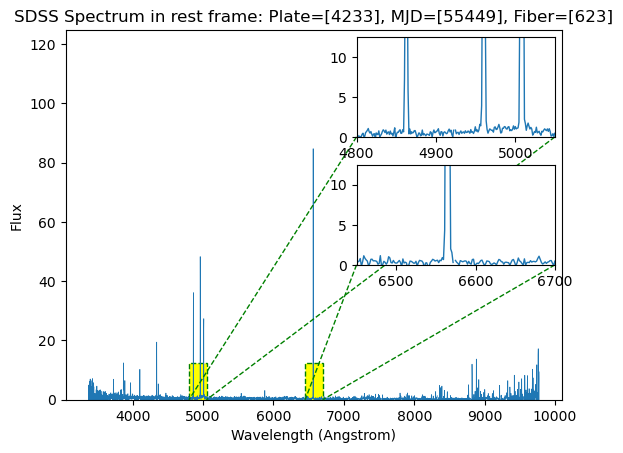

SDSS Spectrum: Plate=[6012], MJD=[56101], Fiber=[730]


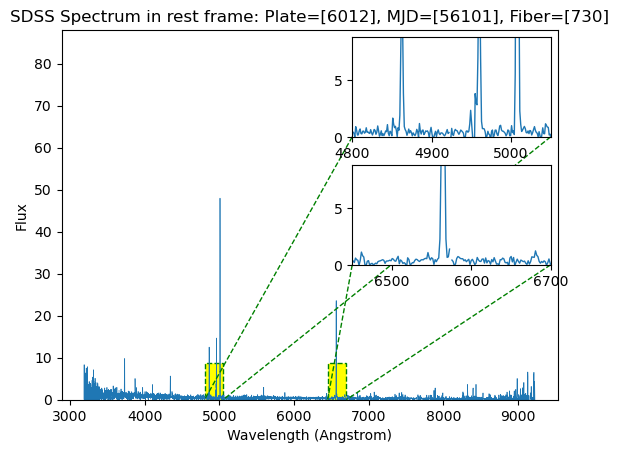

SDSS Spectrum: Plate=[4700], MJD=[55709], Fiber=[969]


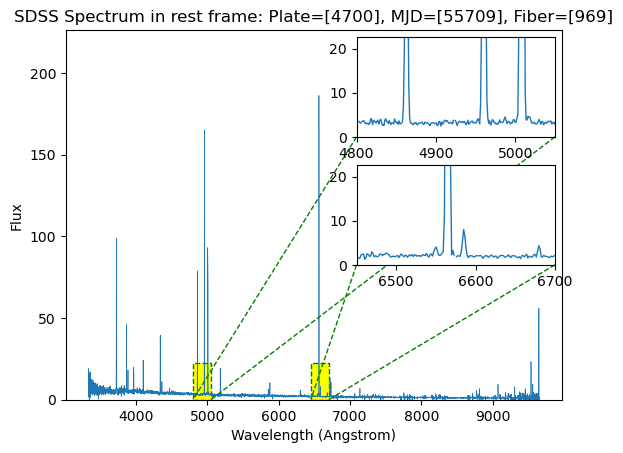

SDSS Spectrum: Plate=[6174], MJD=[56243], Fiber=[57]


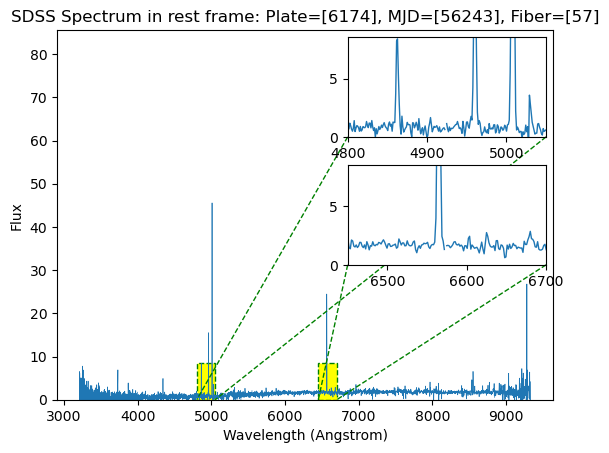

SDSS Spectrum: Plate=[6706], MJD=[56385], Fiber=[307]


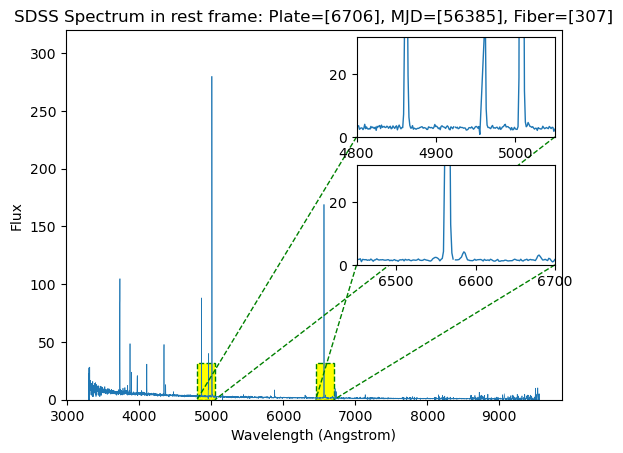

SDSS Spectrum: Plate=[6790], MJD=[56430], Fiber=[85]


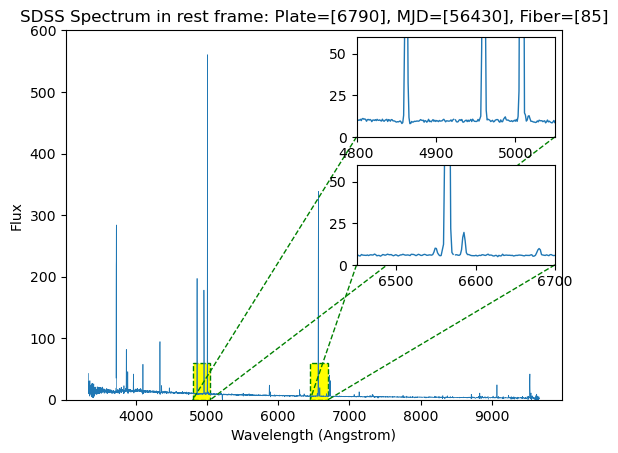

SDSS Spectrum: Plate=[8178], MJD=[57428], Fiber=[645]


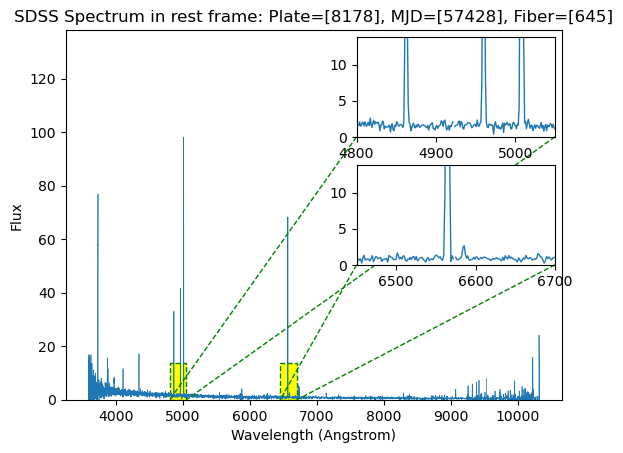

SDSS Spectrum: Plate=[11385], MJD=[58523], Fiber=[874]


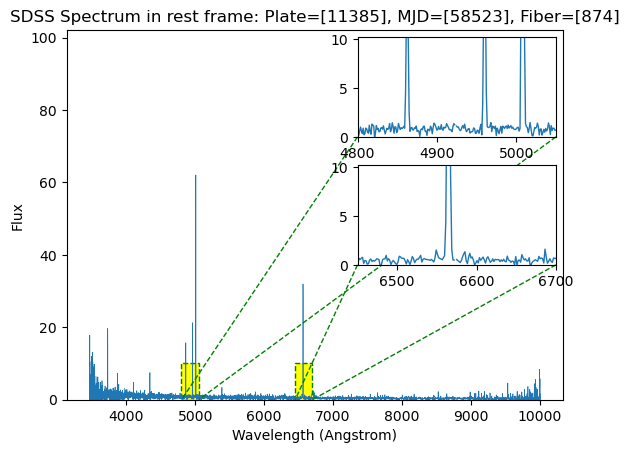

In [310]:
matched_galaxies = []

for rows in LoTSS_match:
    ra = rows[0]
    dec = rows[1]
    error = 0.00001
    samp_gal = cut_gals[(abs(cut_gals['RA']-ra) <error) & (abs(cut_gals['DEC']-dec)<error)]
    matched_galaxies.append(samp_gal)
    plate = samp_gal["PLATE"]
    mjd = samp_gal["MJD"]
    fiber = samp_gal["FIBER"]
    
    print(f"SDSS Spectrum: Plate={plate}, MJD={mjd}, Fiber={fiber}")
    
    
    sp = SDSS.get_spectra(plate=plate, mjd=mjd, fiberID=fiber)
    
    spec_hdu = sp[0]
    spec_data = spec_hdu[1].data
    
    z = spec_hdu[2].data["z"]
    
    header = spec_hdu[0].header
    
    loglam = spec_data['loglam']
    flux = spec_data['flux']
    wavelength = 10**loglam
    
    fig, ax = plt.subplots()
    
    #plot the spectrum
    plt.plot(wavelength/(1+z), flux, linewidth=0.5)
    plt.xlabel("Wavelength (Angstrom)")
    plt.ylabel("Flux")
    y_top = max(flux) + 40
    plt.ylim(0,y_top)
    plt.title(f"SDSS Spectrum in rest frame: Plate={plate}, MJD={mjd}, Fiber={fiber}")

    #inset plot
    inset1 = inset_axes(ax, width='40%', height='27%', loc='upper right',)
    inset1.plot(wavelength/(1+z), flux, linewidth=1)
    inset1.set_xlim(4800, 5050)
    inset1.set_ylim(0, y_top/10)
    mark_inset(ax, inset1, loc1=3, loc2=4, fc='yellow', ec='g', ls='--')
    
    #inset plot
    inset2 = inset_axes(ax, width='40%', height='27%', loc='center right',)
    inset2.plot(wavelength/(1+z), flux, linewidth=1)
    inset2.set_xlim(6450, 6700)
    inset2.set_ylim(0, y_top/10)
    mark_inset(ax, inset2, loc1=3, loc2=4, fc='yellow', ec='g', ls='--')
    
    plt.savefig(str(samp_gal["PLATE"][0]) + "-" + str(samp_gal["MJD"][0])+ "-"+ str(samp_gal["FIBER"][0])+".jpeg")
    
    plt.show()

In [312]:
def merge_images(file1, file2):
    """Merge two images into one, displayed side by side
    :param file1: path to first image file
    :param file2: path to second image file
    :return: the merged Image object
    """
    image1 = Image.open(file1)
    image2 = Image.open(file2)
    (width1, height1) = image1.size
    (width2, height2) = image2.size

    result_height = height1 + height2
    result_width = max(width1, width2)

    result = Image.new('RGB', (result_width, result_height))
    result.paste(im=image1, box=(0, 0))
    result.paste(im=image2, box=(0, height1))
    return result

for i in range(int(len(matched_galaxies)/2)):
    gal1 = matched_galaxies[2*i]
    im1 = str(gal1["PLATE"][0]) + "-" + str(gal1["MJD"][0])+ "-"+ str(gal1["FIBER"][0])+".jpeg"
    gal2 = matched_galaxies[2*i+1]
    im2 = str(gal2["PLATE"][0]) + "-" + str(gal2["MJD"][0])+ "-"+ str(gal2["FIBER"][0])+".jpeg"
    merge = merge_images(im1, im2)
    merge.save(str(i)+".jpeg")

pdf = FPDF()
# imagelist is the list with all image filenames
for i in range(int(len(matched_galaxies)/2)):
    pdf.add_page()
    pdf.image(str(i)+".jpeg",w=pdf.epw,h=pdf.eph)
pdf.output("yourfile.pdf")

In [328]:
WISE_match = fits.open("WISE_match.fits", memmap=True)
WISE_data = WISE_match[1].data
WISE_match.info()
print(WISE_match[1].columns)

WISE_RA = WISE_data['Column1']
WISE_DEC = WISE_data['Column2']

Filename: WISE_match.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      16   (4560,)   uint8   
  1  10xAllWISE    1 BinTableHDU    147   138R x 33C   ['D', 'D', '19A', 'D', 'D', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'K', '4A', '1A', '4A', '4A', 'J', 'J', 'J', 'J', 'E', 'D']   
ColDefs(
    name = 'Column1'; format = 'D'
    name = 'Column2'; format = 'D'
    name = 'AllWISE'; format = '19A'
    name = 'RAJ2000'; format = 'D'; unit = 'deg'
    name = 'DEJ2000'; format = 'D'; unit = 'deg'
    name = 'eeMaj'; format = 'E'; unit = 'arcsec'
    name = 'eeMin'; format = 'E'; unit = 'arcsec'
    name = 'eePA'; format = 'E'; unit = 'deg'
    name = 'W1mag'; format = 'E'; unit = 'mag'
    name = 'W2mag'; format = 'E'; unit = 'mag'
    name = 'W3mag'; format = 'E'; unit = 'mag'
    name = 'W4mag'; format = 'E'; unit = 'mag'
    name = 'Jmag'; format = 'E'; unit = 'mag'
    name = 'Hmag'; format =

0
SDSS Spectrum: Plate=3589, MJD=55186, Fiber=368


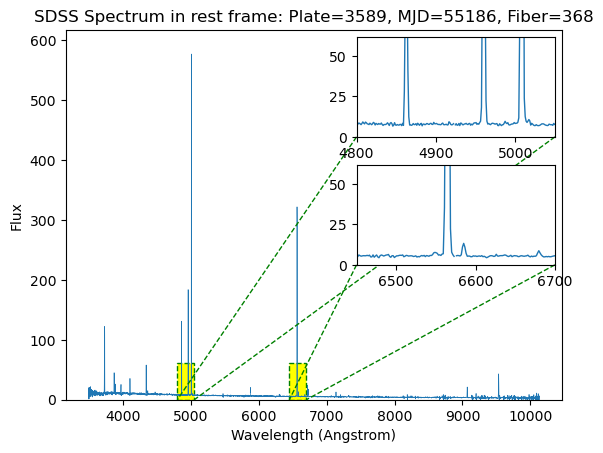

1
SDSS Spectrum: Plate=3589, MJD=55186, Fiber=374


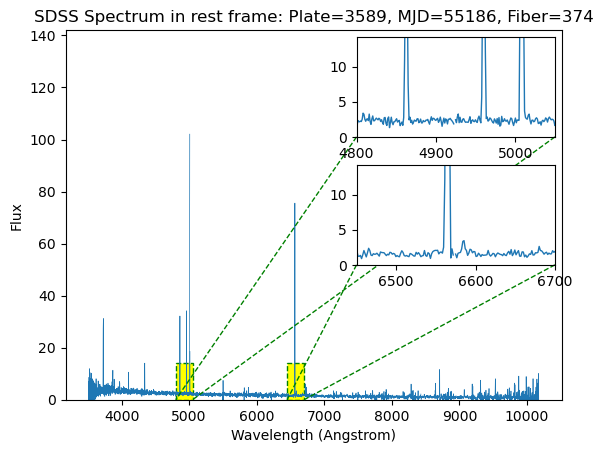

2
SDSS Spectrum: Plate=3647, MJD=56568, Fiber=42


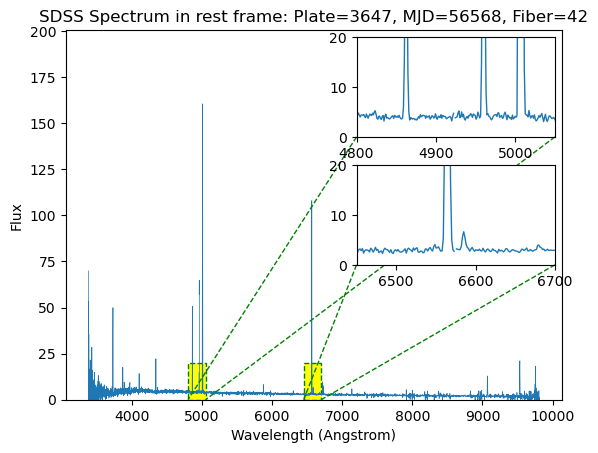

3
SDSS Spectrum: Plate=3650, MJD=55244, Fiber=340


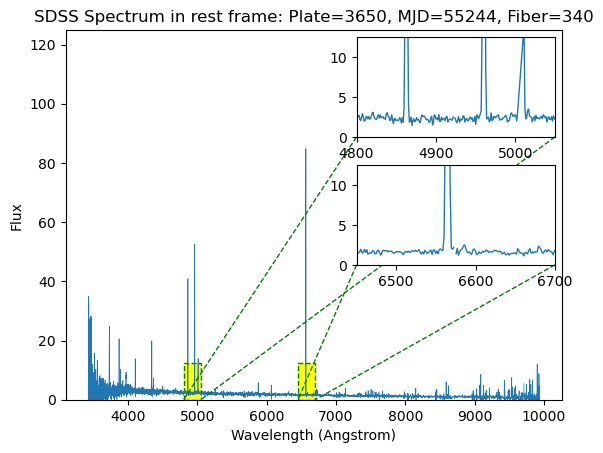

4
SDSS Spectrum: Plate=3660, MJD=55209, Fiber=711


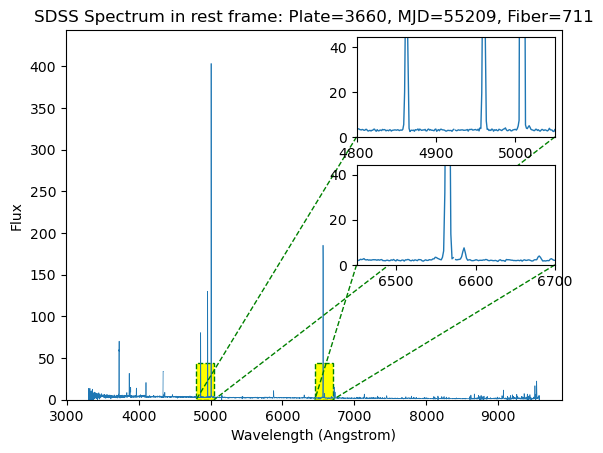

SDSS Spectrum: Plate=3663, MJD=55176, Fiber=387


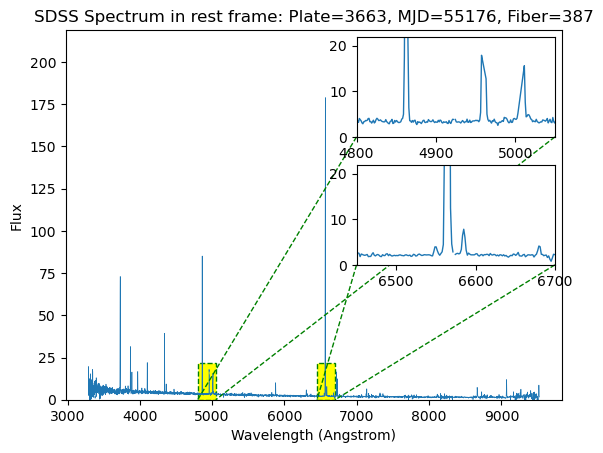

SDSS Spectrum: Plate=5943, MJD=56218, Fiber=393


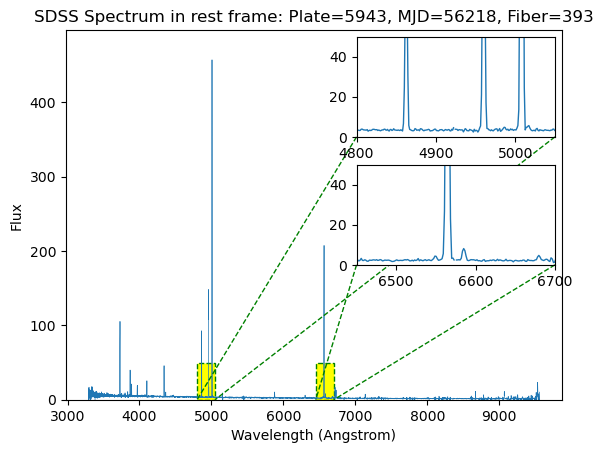

5
SDSS Spectrum: Plate=3660, MJD=55209, Fiber=711


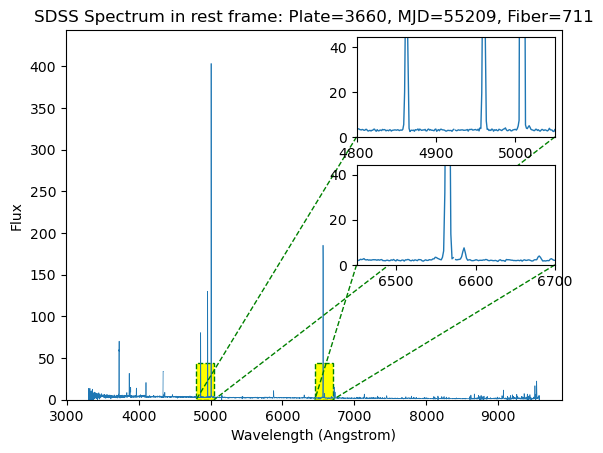

SDSS Spectrum: Plate=3663, MJD=55176, Fiber=387


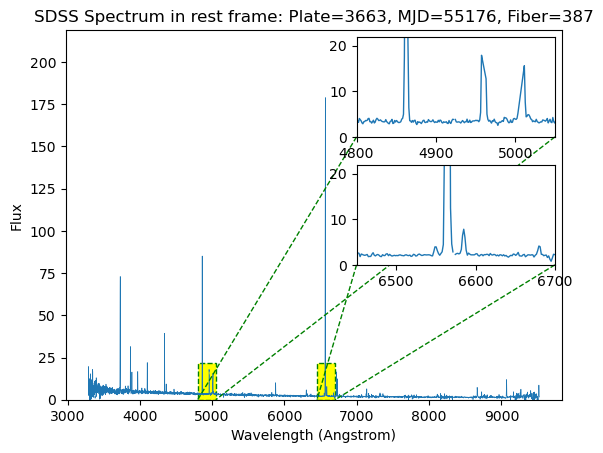

SDSS Spectrum: Plate=5943, MJD=56218, Fiber=393


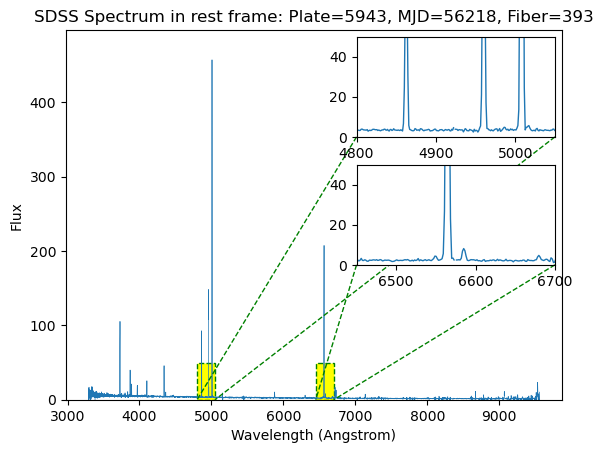

6
SDSS Spectrum: Plate=3691, MJD=55274, Fiber=169


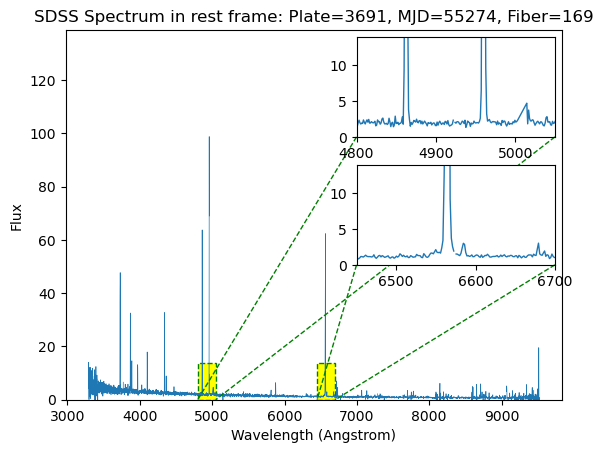

7
SDSS Spectrum: Plate=3744, MJD=55209, Fiber=368


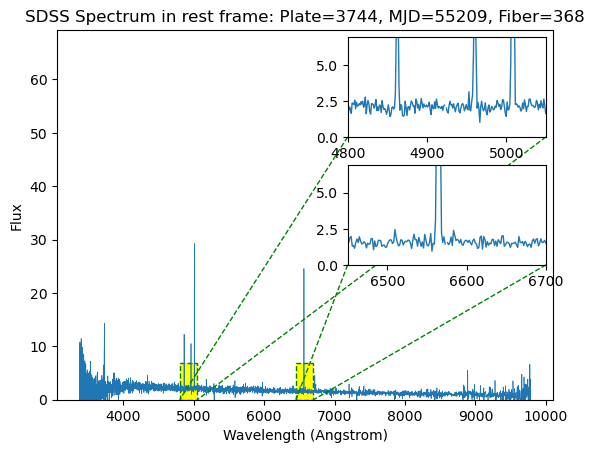

8
SDSS Spectrum: Plate=3830, MJD=55574, Fiber=381


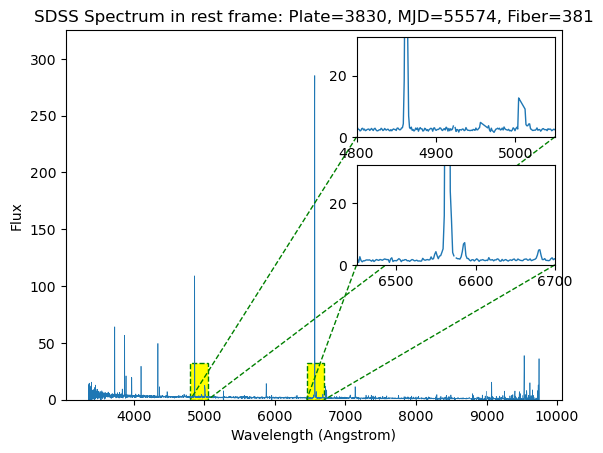

9
SDSS Spectrum: Plate=3837, MJD=55572, Fiber=639


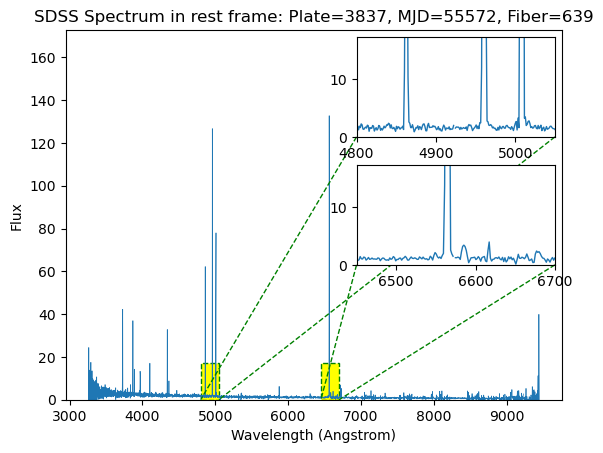

10
SDSS Spectrum: Plate=3843, MJD=55278, Fiber=159


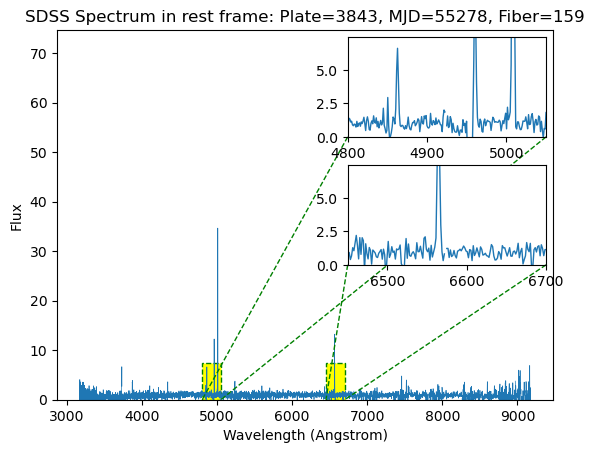

11
SDSS Spectrum: Plate=3864, MJD=55649, Fiber=861


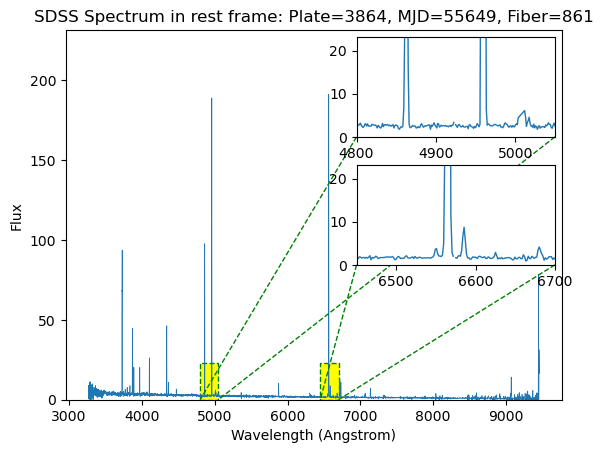

12
SDSS Spectrum: Plate=3874, MJD=55280, Fiber=437


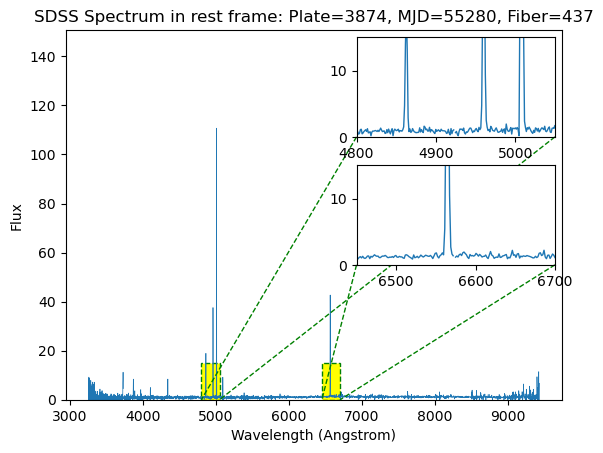

13
SDSS Spectrum: Plate=3949, MJD=55650, Fiber=400


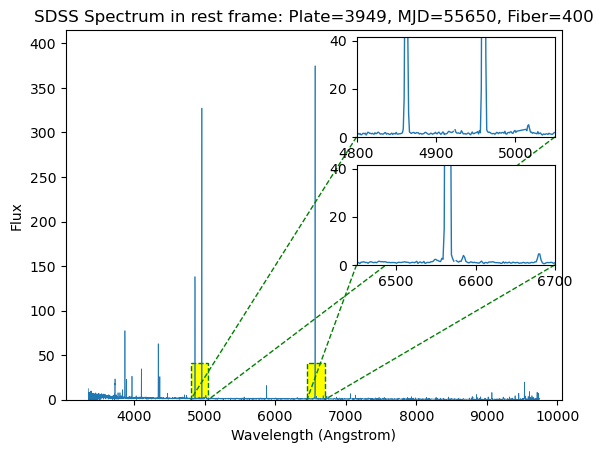

14
SDSS Spectrum: Plate=3954, MJD=55680, Fiber=189


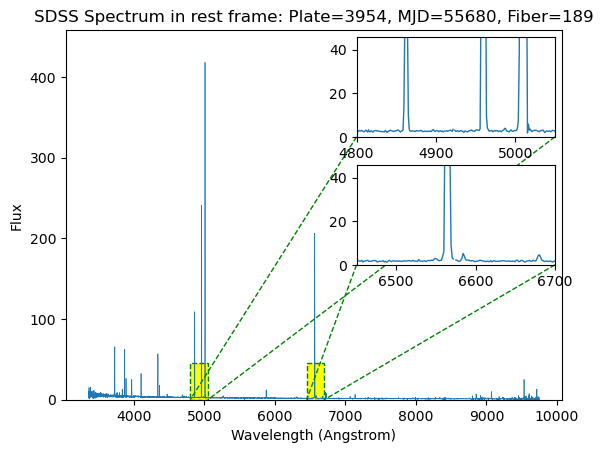

15
SDSS Spectrum: Plate=3957, MJD=55664, Fiber=360


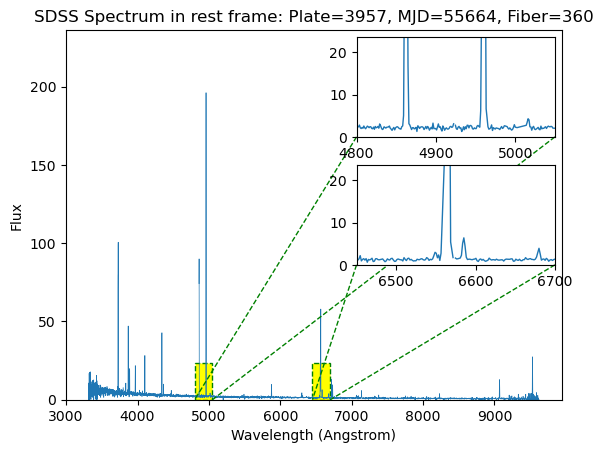

16
SDSS Spectrum: Plate=3961, MJD=55654, Fiber=19


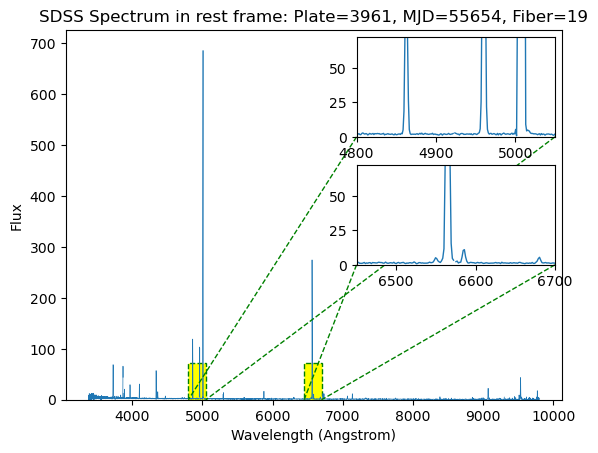

17
SDSS Spectrum: Plate=3977, MJD=55335, Fiber=325


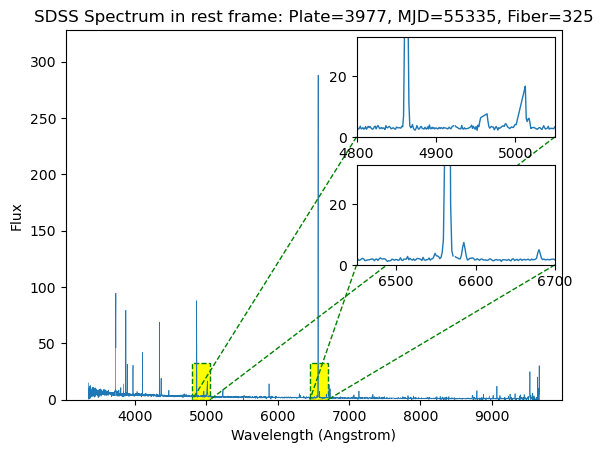

18
SDSS Spectrum: Plate=3981, MJD=55603, Fiber=460


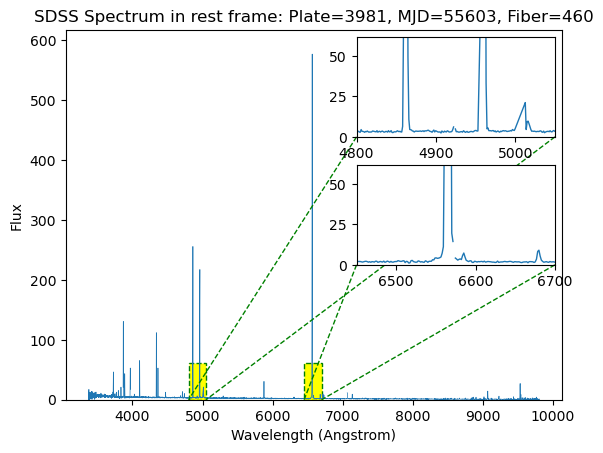

19
SDSS Spectrum: Plate=4181, MJD=55685, Fiber=71


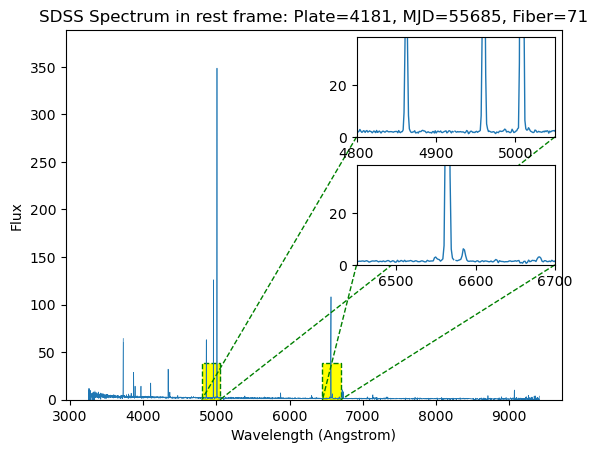

20
SDSS Spectrum: Plate=4193, MJD=55476, Fiber=853


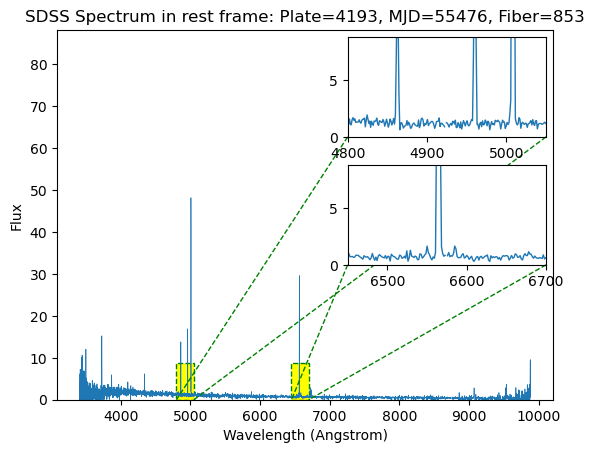

21
SDSS Spectrum: Plate=4258, MJD=55481, Fiber=863


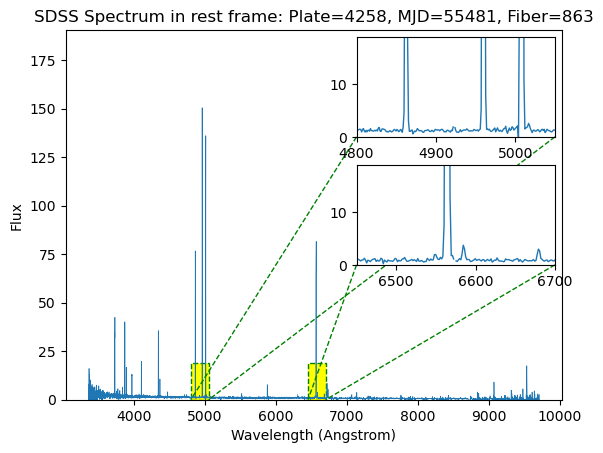

22
SDSS Spectrum: Plate=4276, MJD=55505, Fiber=279


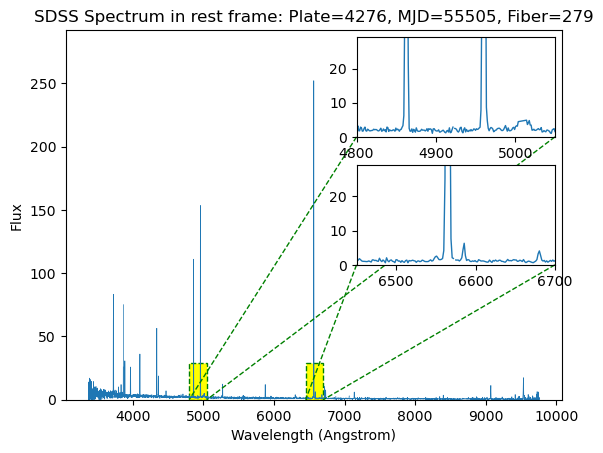

23
SDSS Spectrum: Plate=4289, MJD=55856, Fiber=311


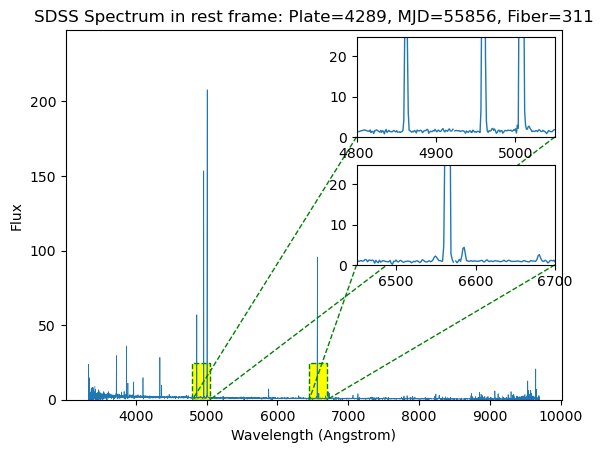

SDSS Spectrum: Plate=4290, MJD=55527, Fiber=943


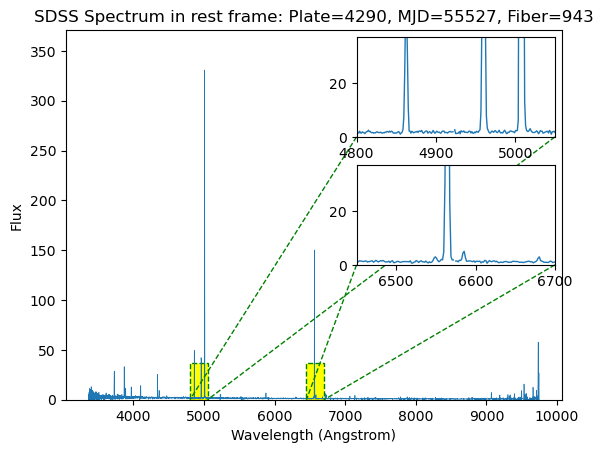

24
SDSS Spectrum: Plate=4289, MJD=55856, Fiber=311


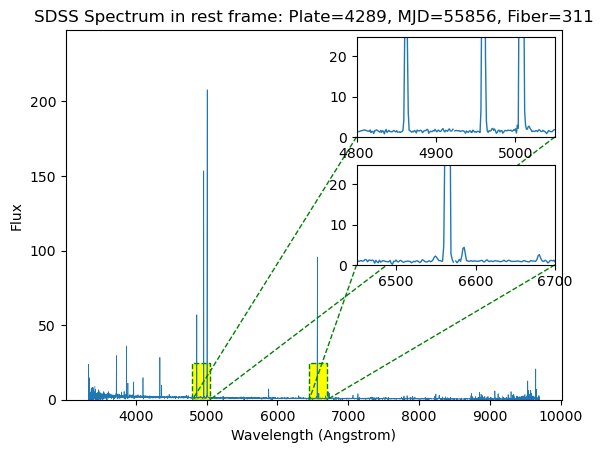

SDSS Spectrum: Plate=4290, MJD=55527, Fiber=943


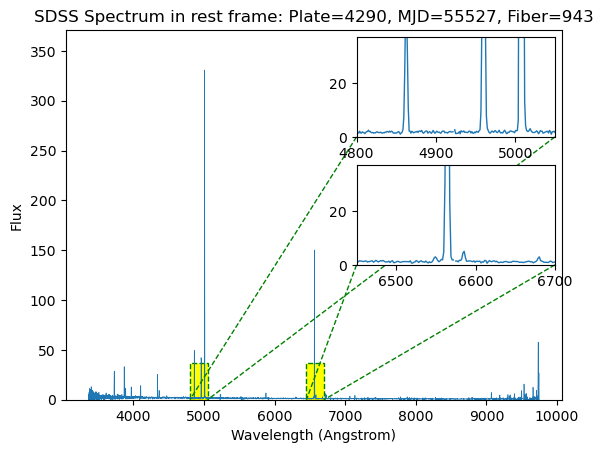

25
SDSS Spectrum: Plate=4297, MJD=55806, Fiber=373


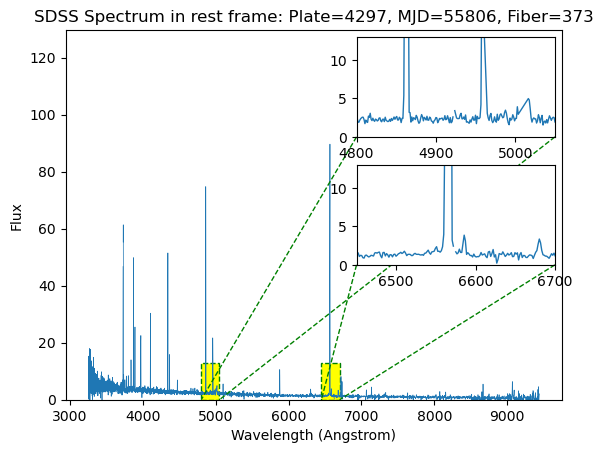

26
SDSS Spectrum: Plate=4404, MJD=55513, Fiber=289


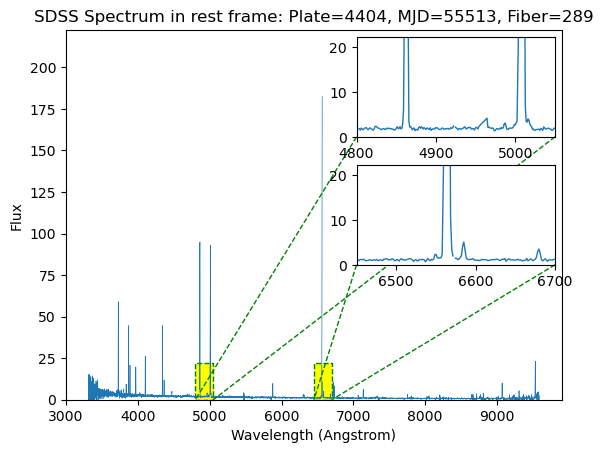

27
SDSS Spectrum: Plate=4412, MJD=55912, Fiber=317


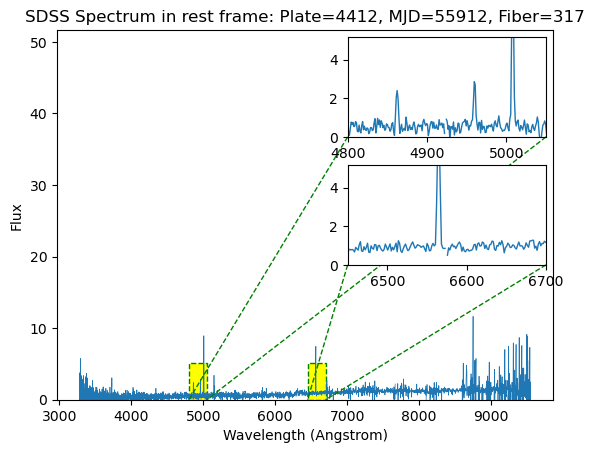

28
SDSS Spectrum: Plate=4453, MJD=55535, Fiber=615


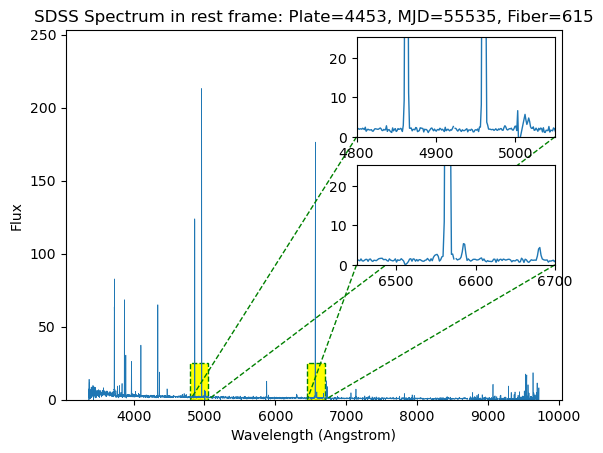

29
SDSS Spectrum: Plate=4467, MJD=55894, Fiber=410


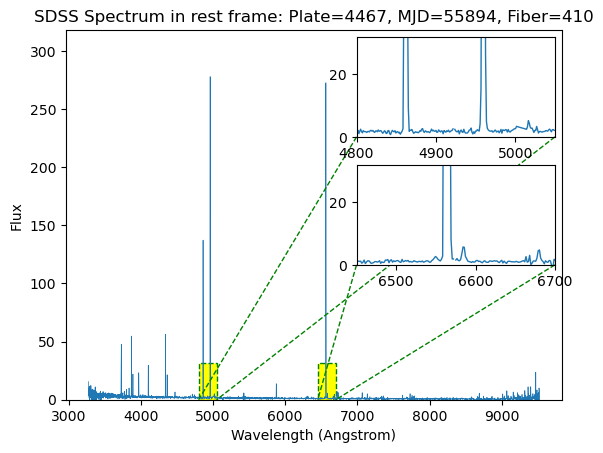

30
SDSS Spectrum: Plate=4485, MJD=55836, Fiber=407


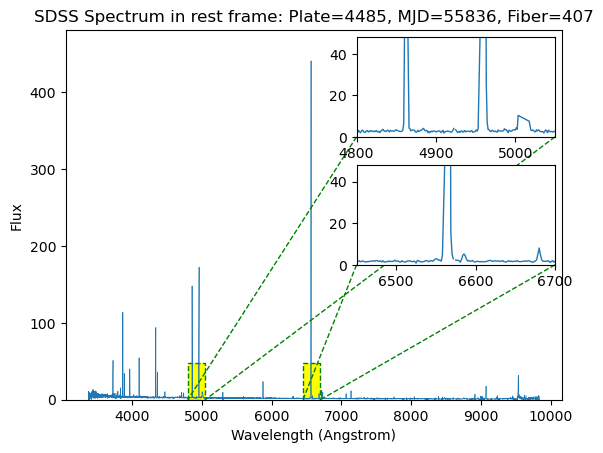

31
SDSS Spectrum: Plate=4531, MJD=55563, Fiber=115


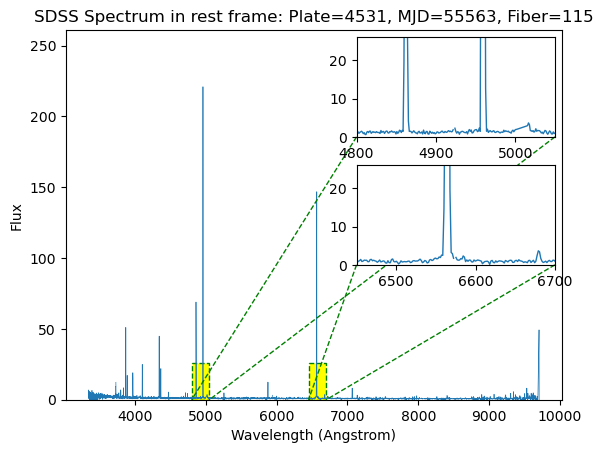

32
SDSS Spectrum: Plate=4605, MJD=55971, Fiber=444


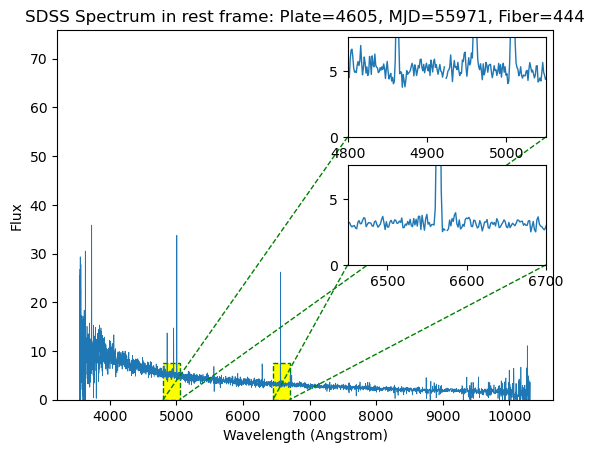

33
SDSS Spectrum: Plate=4612, MJD=55590, Fiber=111


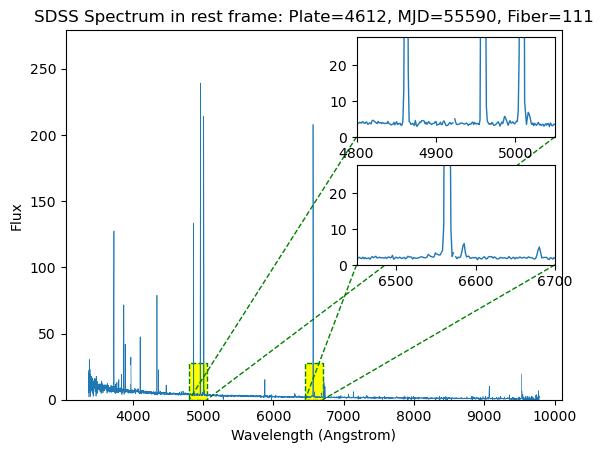

34
SDSS Spectrum: Plate=4627, MJD=55626, Fiber=187


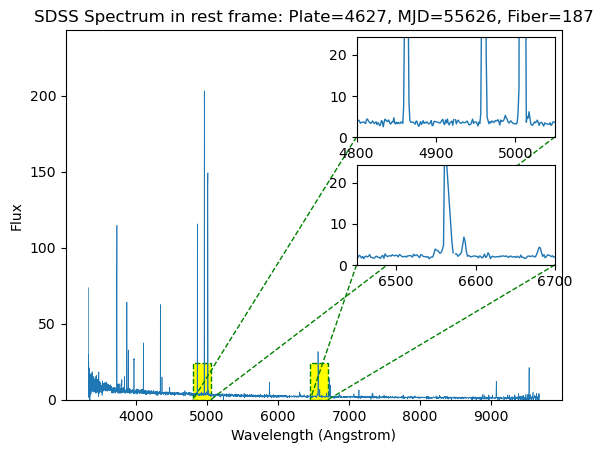

35
SDSS Spectrum: Plate=4652, MJD=55672, Fiber=584


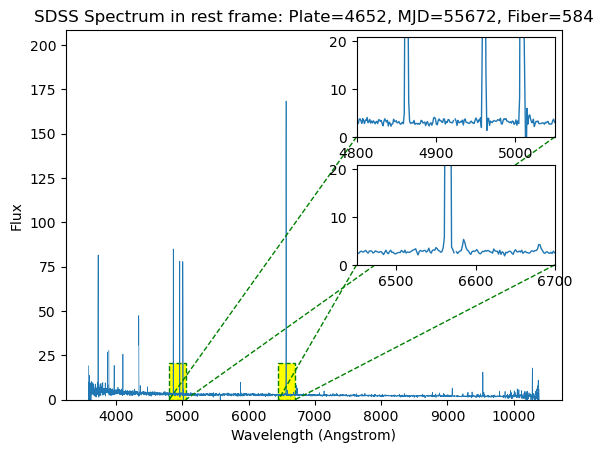

36
SDSS Spectrum: Plate=4661, MJD=55614, Fiber=29


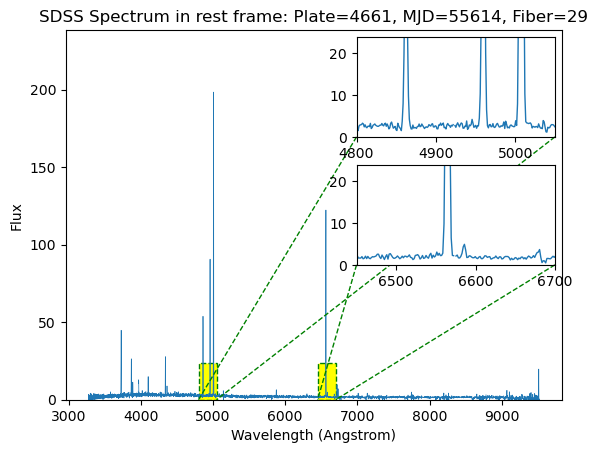

37
SDSS Spectrum: Plate=4690, MJD=55653, Fiber=24


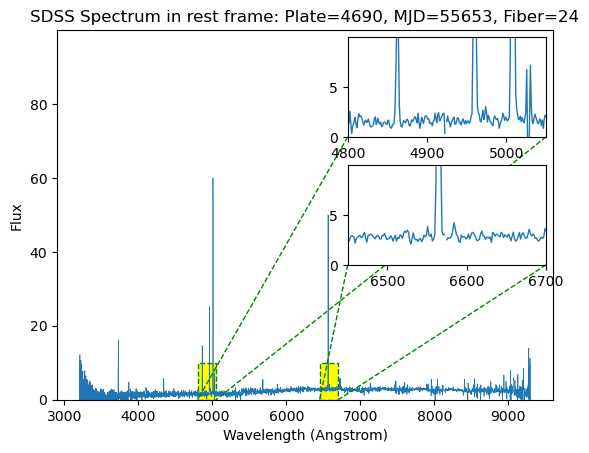

38
SDSS Spectrum: Plate=4699, MJD=55684, Fiber=531


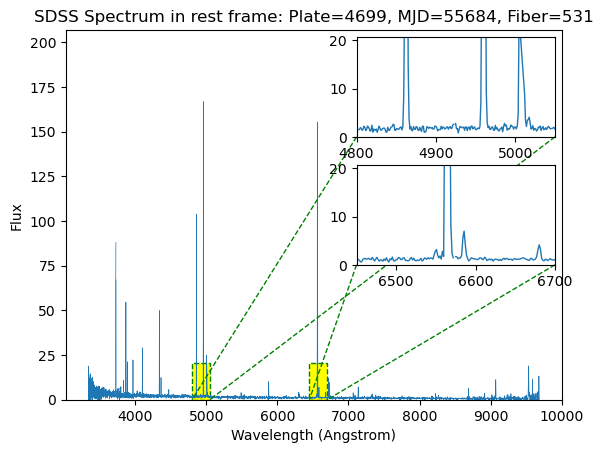

39
SDSS Spectrum: Plate=4726, MJD=55712, Fiber=566


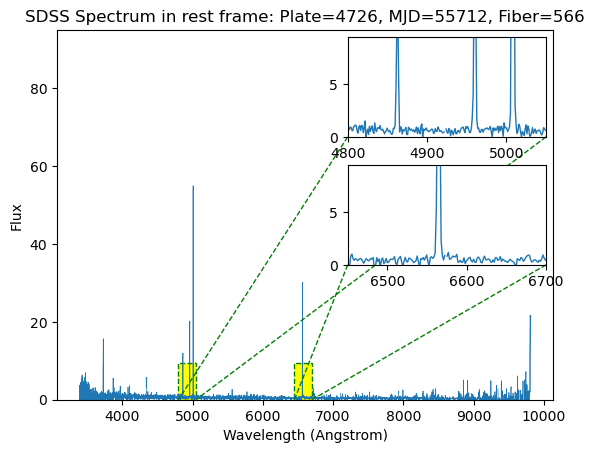

40
SDSS Spectrum: Plate=4748, MJD=55631, Fiber=315


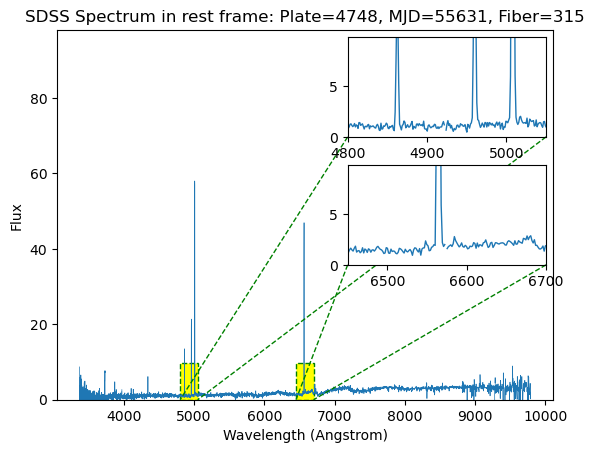

41
SDSS Spectrum: Plate=4766, MJD=55677, Fiber=455


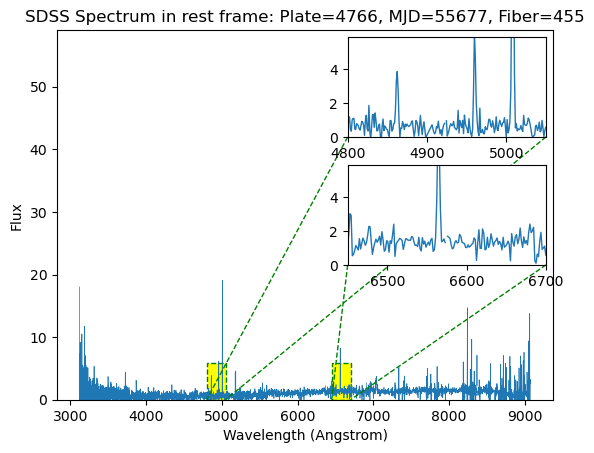

42
SDSS Spectrum: Plate=4839, MJD=55703, Fiber=701


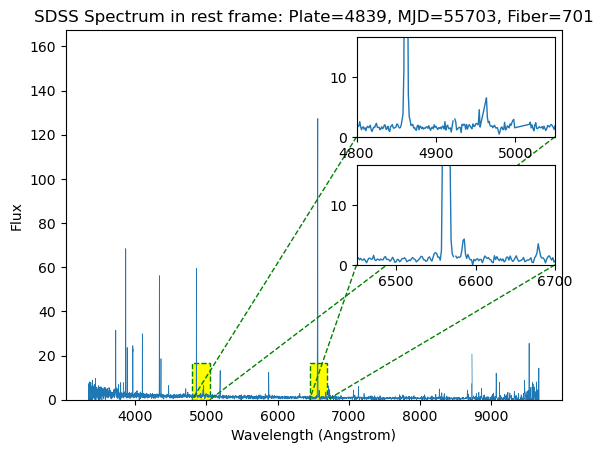

43
SDSS Spectrum: Plate=4862, MJD=55685, Fiber=295


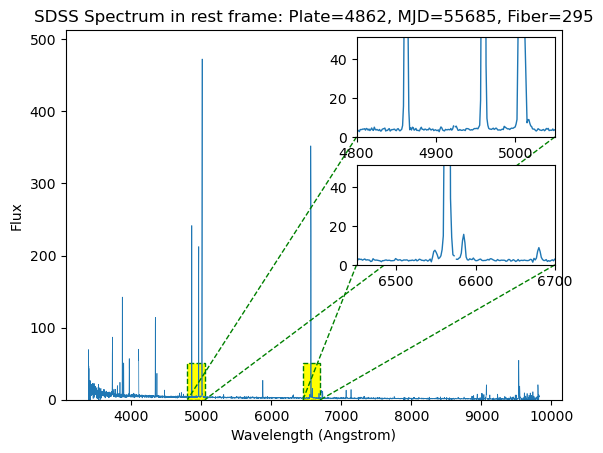

44
SDSS Spectrum: Plate=5045, MJD=56181, Fiber=997


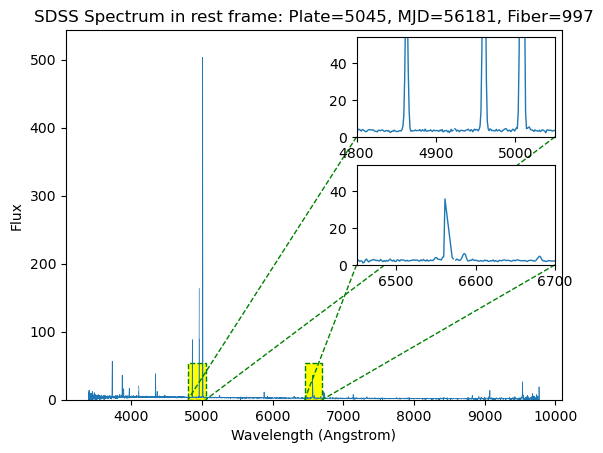

45
SDSS Spectrum: Plate=5046, MJD=56243, Fiber=589


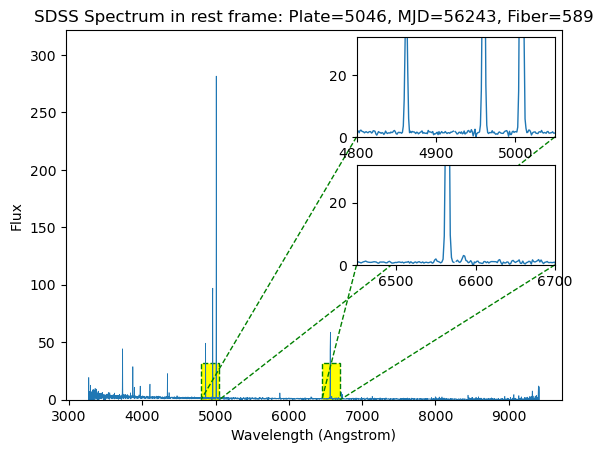

46
SDSS Spectrum: Plate=5115, MJD=55885, Fiber=87


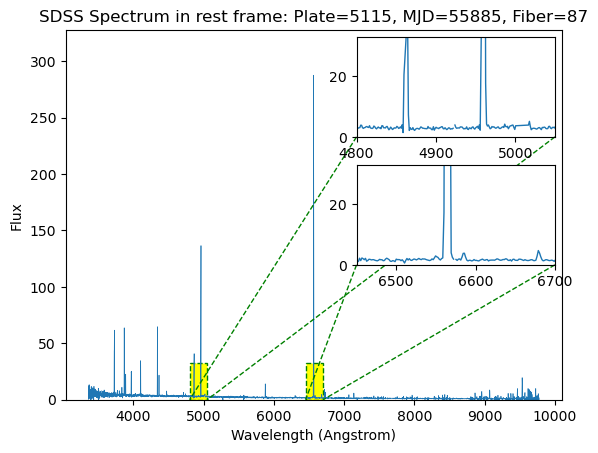

47
SDSS Spectrum: Plate=5177, MJD=56245, Fiber=742


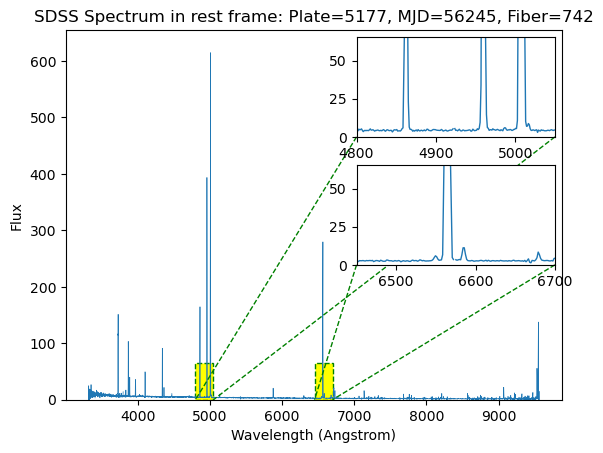

48
SDSS Spectrum: Plate=5299, MJD=55927, Fiber=957


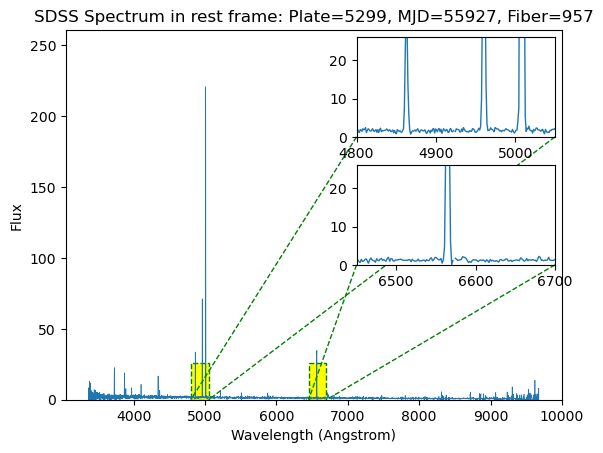

49
SDSS Spectrum: Plate=5371, MJD=55976, Fiber=568


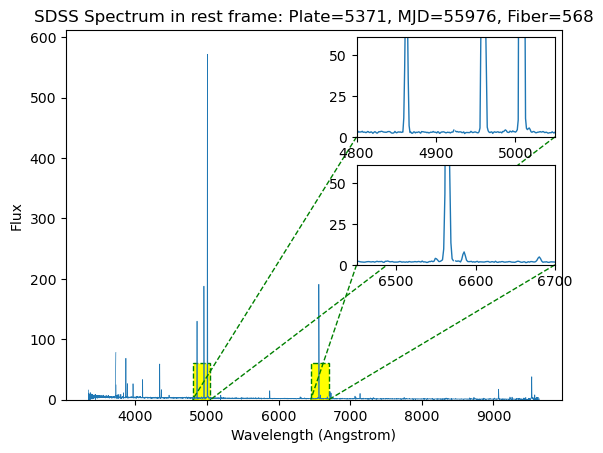

50
SDSS Spectrum: Plate=5381, MJD=56009, Fiber=227


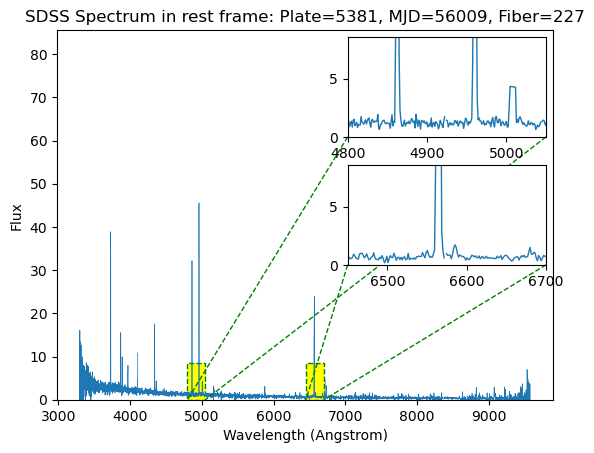

51
SDSS Spectrum: Plate=5411, MJD=55953, Fiber=711


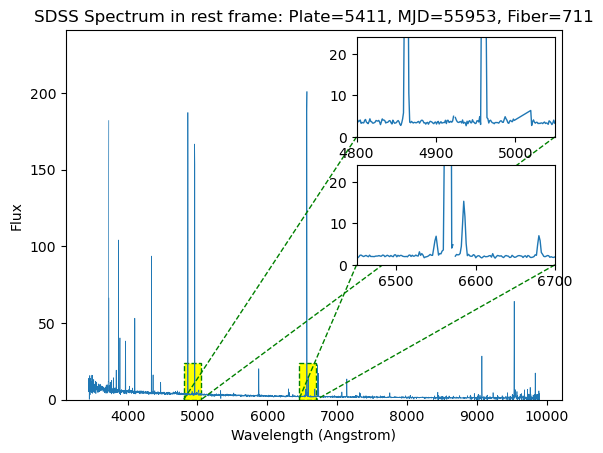

52
SDSS Spectrum: Plate=5416, MJD=56002, Fiber=924


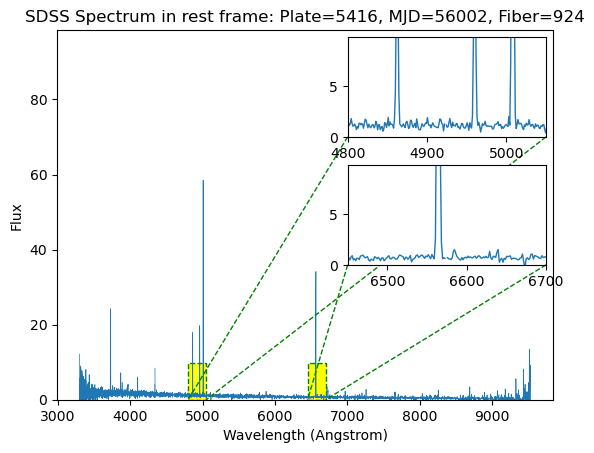

53
SDSS Spectrum: Plate=5419, MJD=55983, Fiber=370


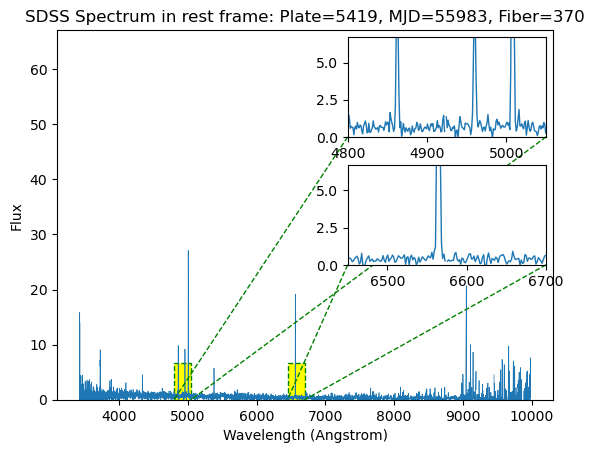

54
SDSS Spectrum: Plate=5438, MJD=56002, Fiber=606


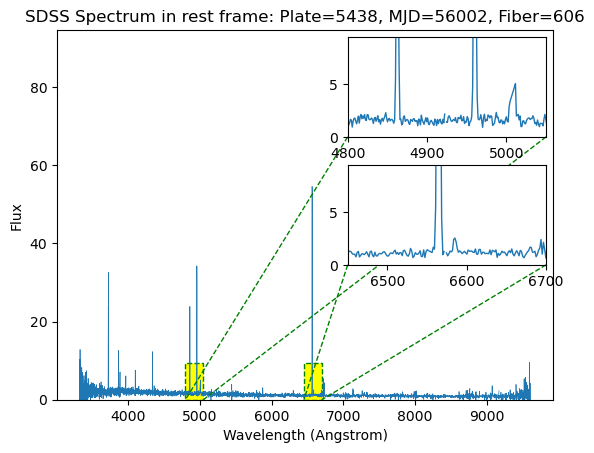

55
SDSS Spectrum: Plate=5444, MJD=56038, Fiber=109


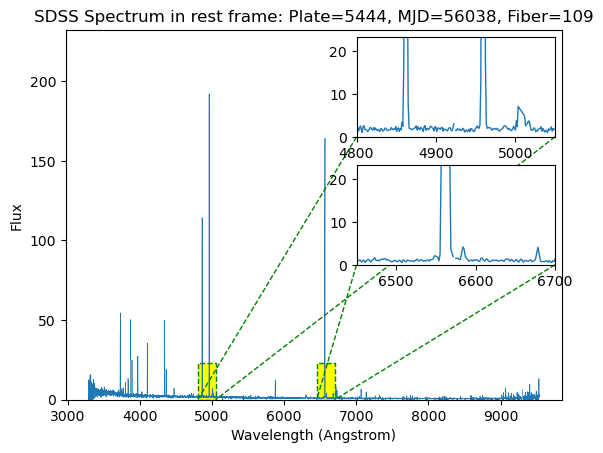

56
SDSS Spectrum: Plate=5444, MJD=56038, Fiber=835


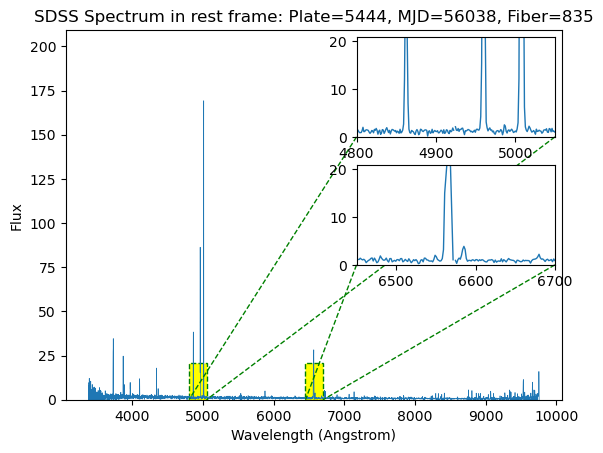

57
SDSS Spectrum: Plate=5702, MJD=56221, Fiber=241


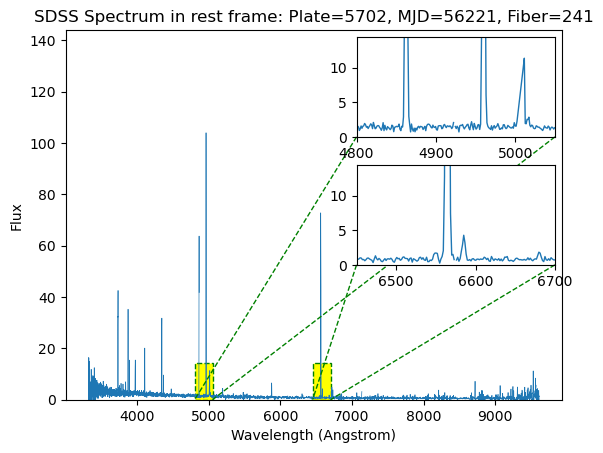

SDSS Spectrum: Plate=5705, MJD=56194, Fiber=551


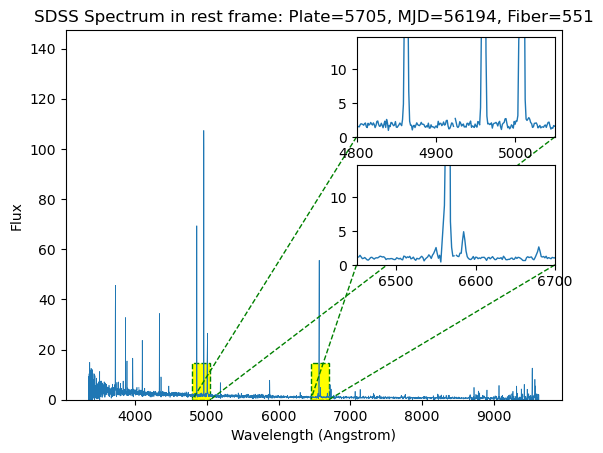

58
SDSS Spectrum: Plate=5702, MJD=56221, Fiber=241


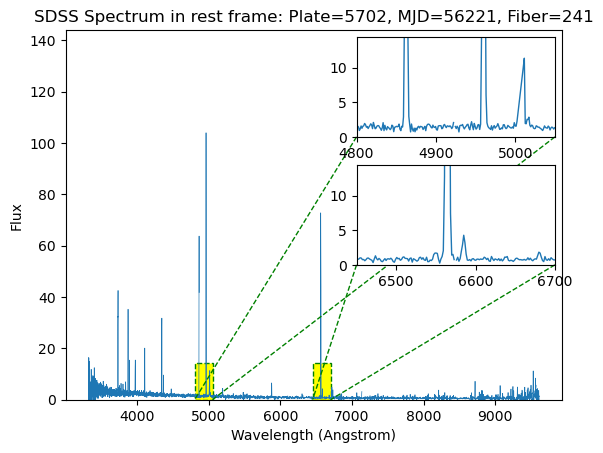

SDSS Spectrum: Plate=5705, MJD=56194, Fiber=551


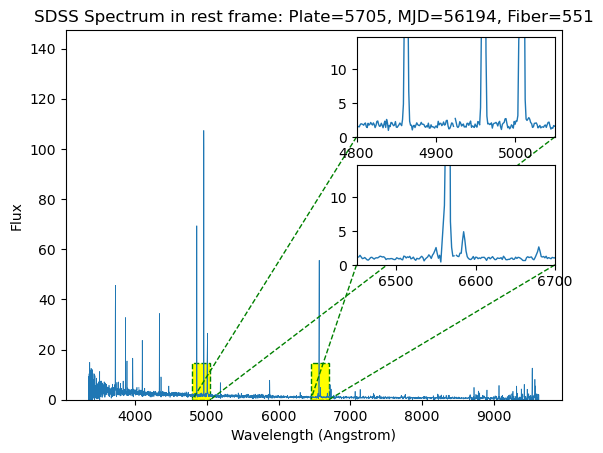

59
SDSS Spectrum: Plate=5767, MJD=56245, Fiber=373


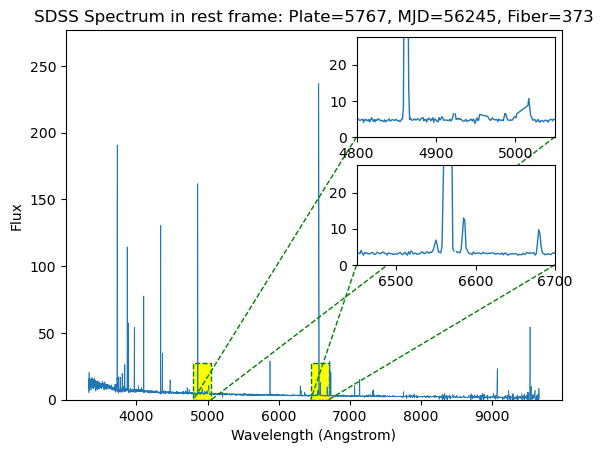

60
SDSS Spectrum: Plate=5795, MJD=56298, Fiber=838


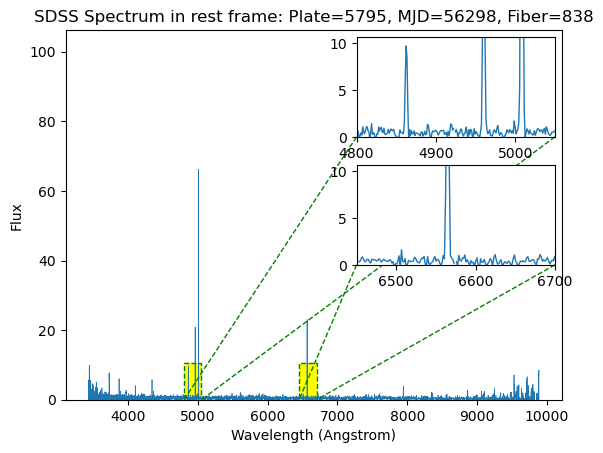

61
SDSS Spectrum: Plate=5895, MJD=56046, Fiber=455


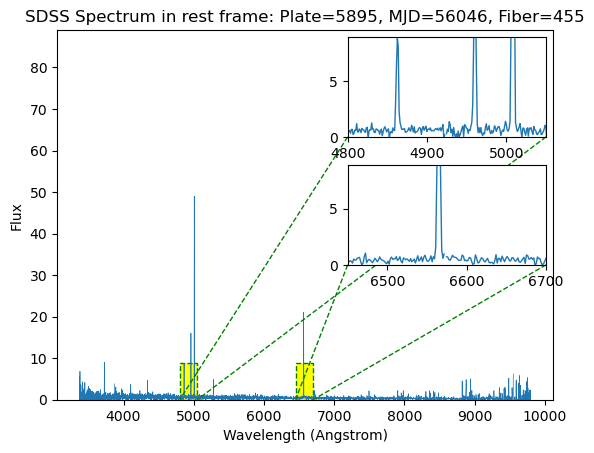

62
SDSS Spectrum: Plate=3660, MJD=55209, Fiber=711


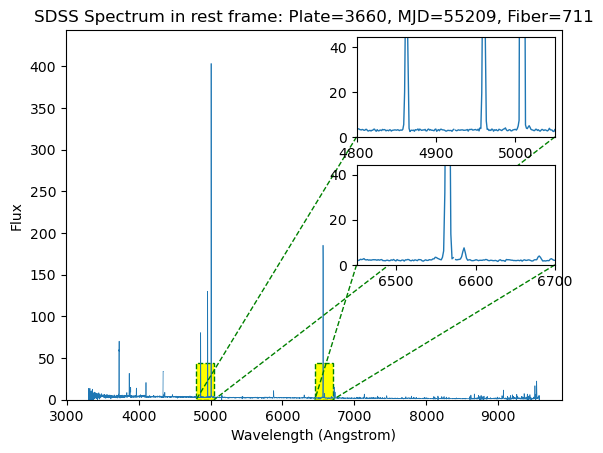

SDSS Spectrum: Plate=3663, MJD=55176, Fiber=387


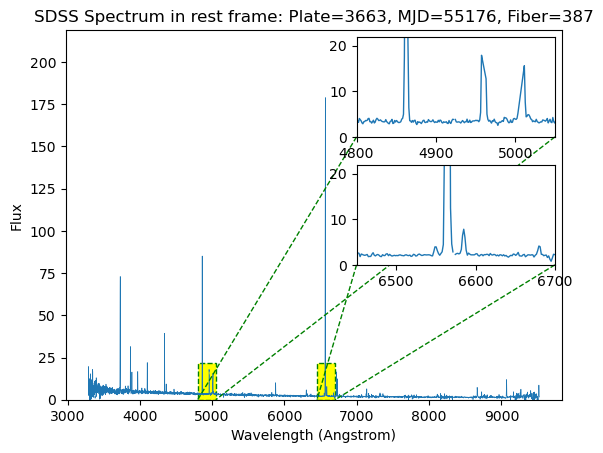

SDSS Spectrum: Plate=5943, MJD=56218, Fiber=393


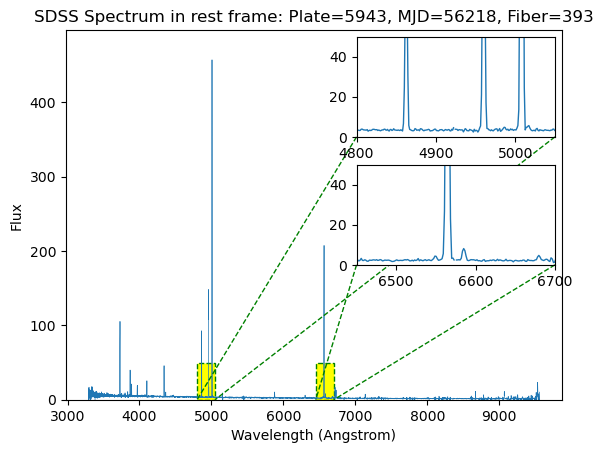

63
SDSS Spectrum: Plate=5950, MJD=56211, Fiber=683


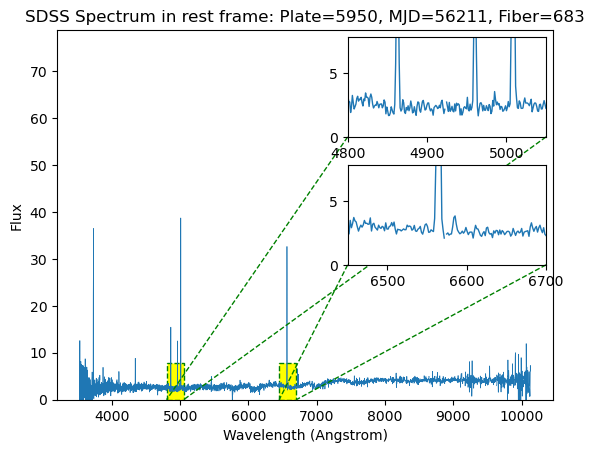

64
SDSS Spectrum: Plate=5987, MJD=56339, Fiber=51


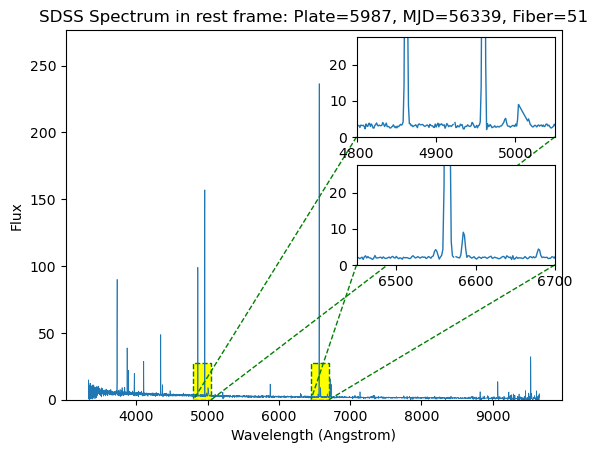

SDSS Spectrum: Plate=5989, MJD=56312, Fiber=749


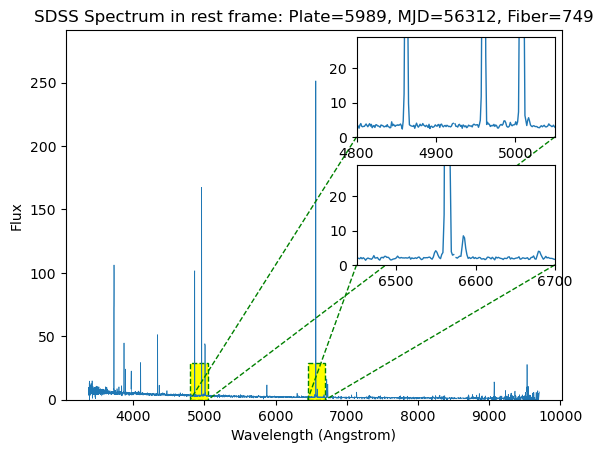

65
SDSS Spectrum: Plate=5987, MJD=56339, Fiber=51


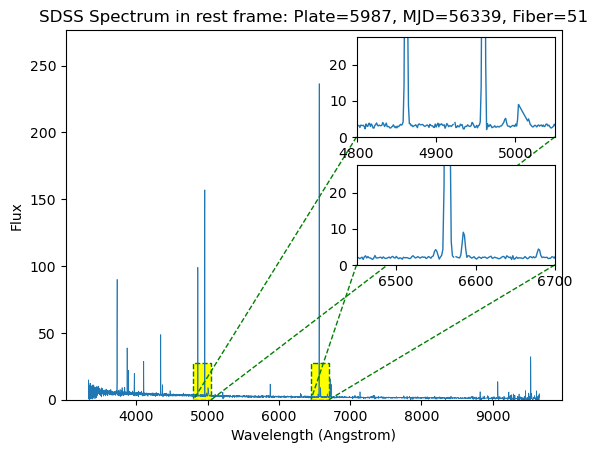

SDSS Spectrum: Plate=5989, MJD=56312, Fiber=749


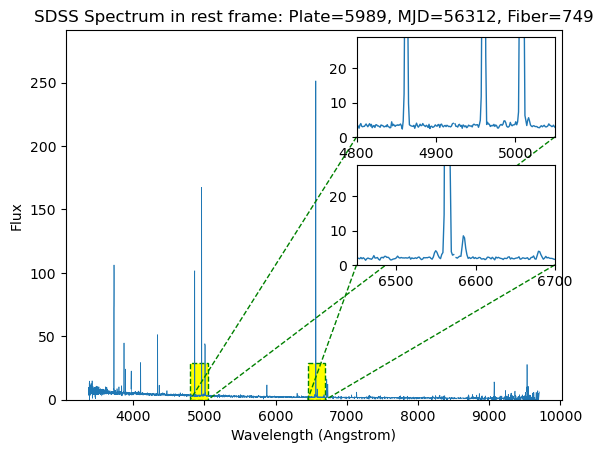

66
SDSS Spectrum: Plate=6000, MJD=56102, Fiber=899


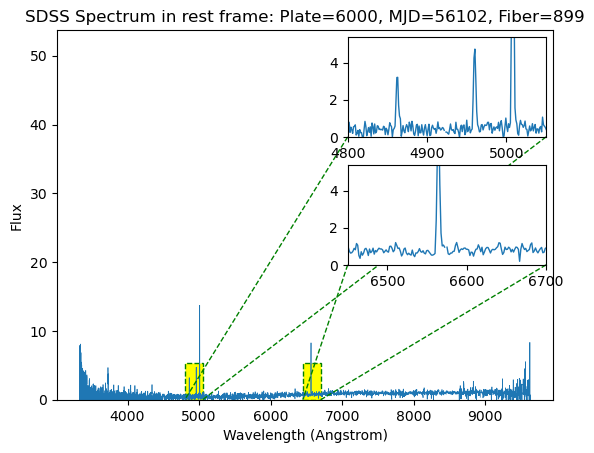

67
SDSS Spectrum: Plate=6114, MJD=56209, Fiber=767


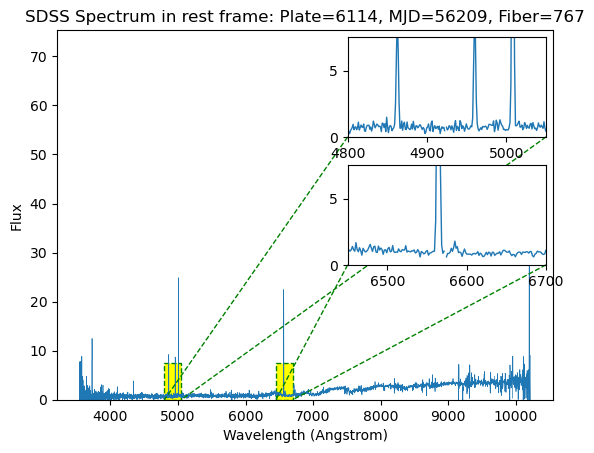

68
SDSS Spectrum: Plate=6174, MJD=56243, Fiber=57


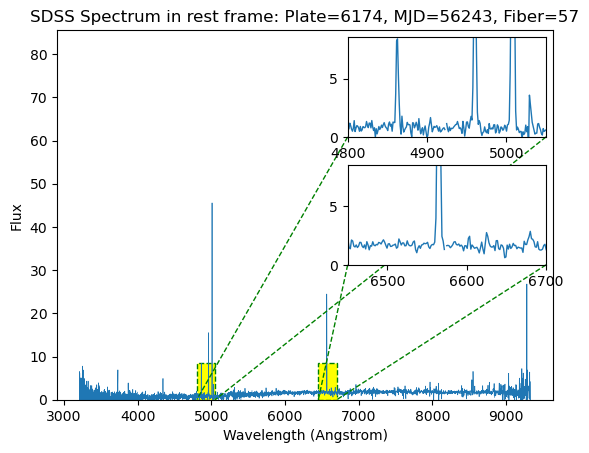

69
SDSS Spectrum: Plate=6178, MJD=56213, Fiber=377


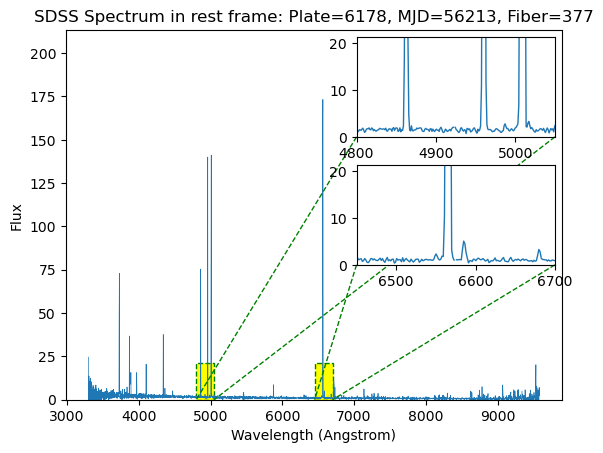

70
SDSS Spectrum: Plate=6304, MJD=56570, Fiber=898


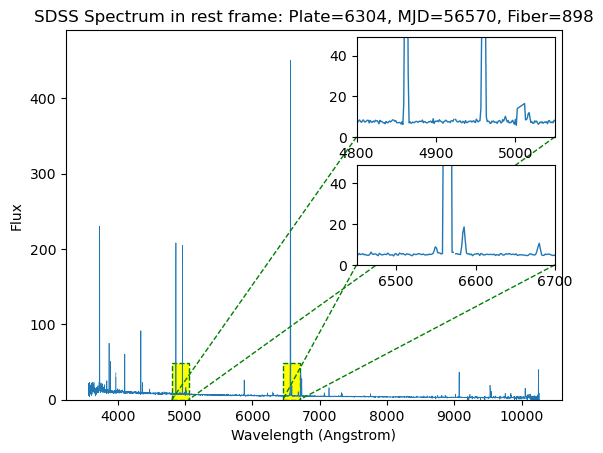

71
SDSS Spectrum: Plate=6312, MJD=56487, Fiber=444


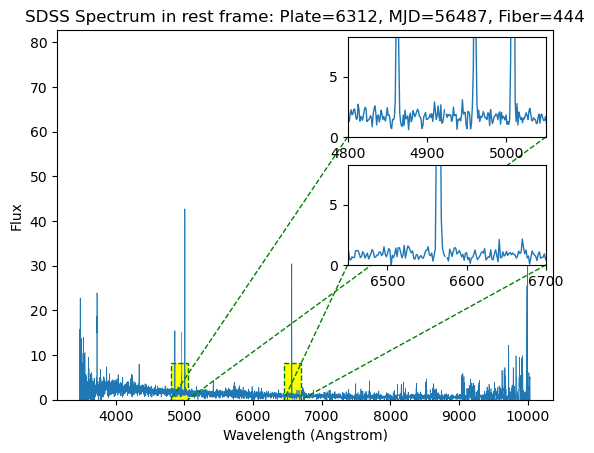

72
SDSS Spectrum: Plate=6402, MJD=56334, Fiber=33


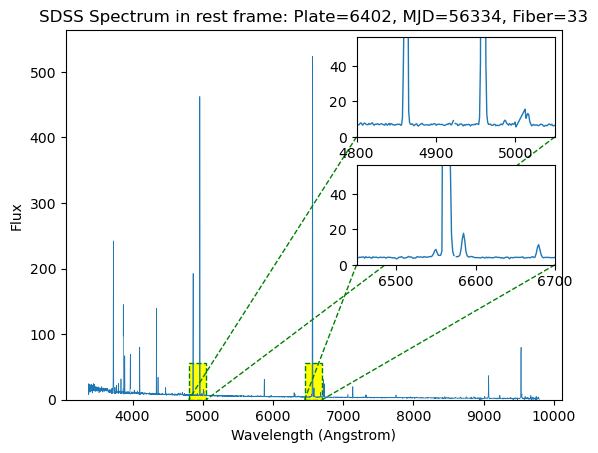

73
SDSS Spectrum: Plate=6409, MJD=56306, Fiber=333


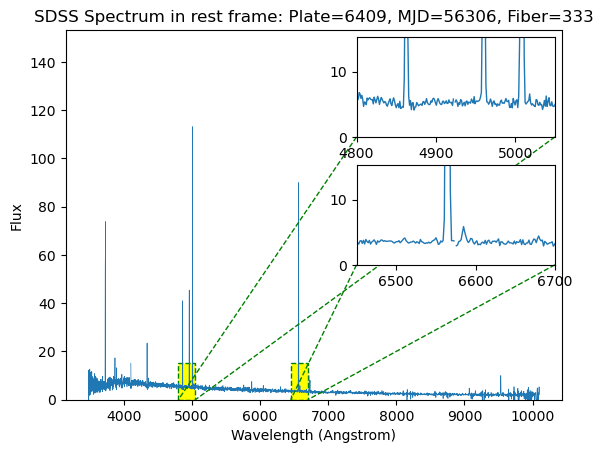

74
SDSS Spectrum: Plate=6409, MJD=56306, Fiber=367


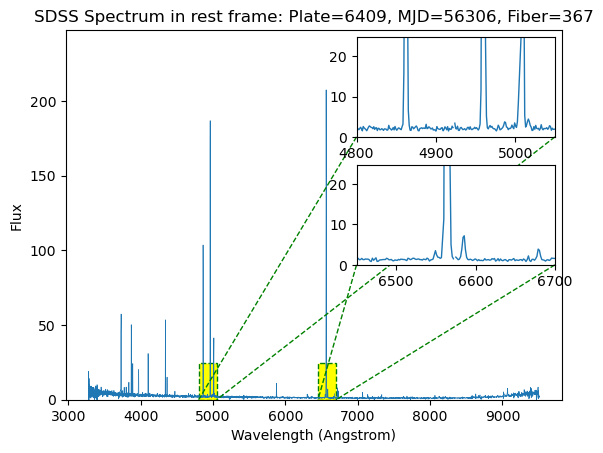

75
SDSS Spectrum: Plate=6425, MJD=56298, Fiber=964


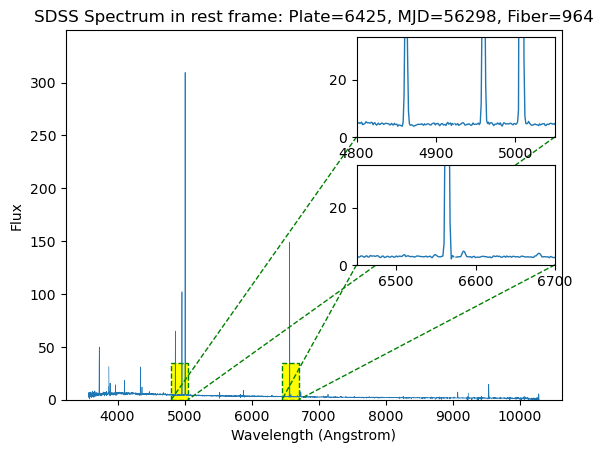

76
SDSS Spectrum: Plate=6439, MJD=56358, Fiber=95


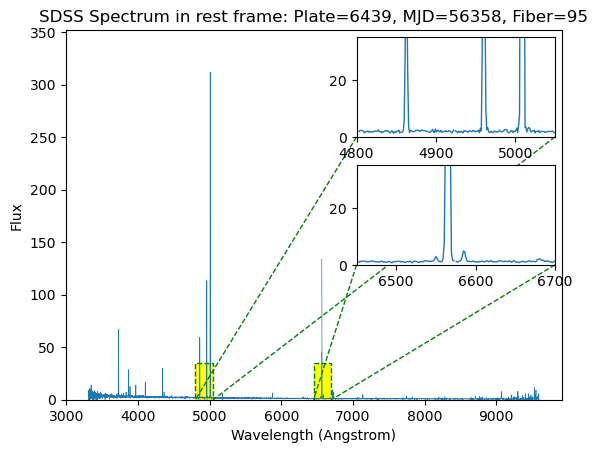

77
SDSS Spectrum: Plate=6458, MJD=56274, Fiber=655


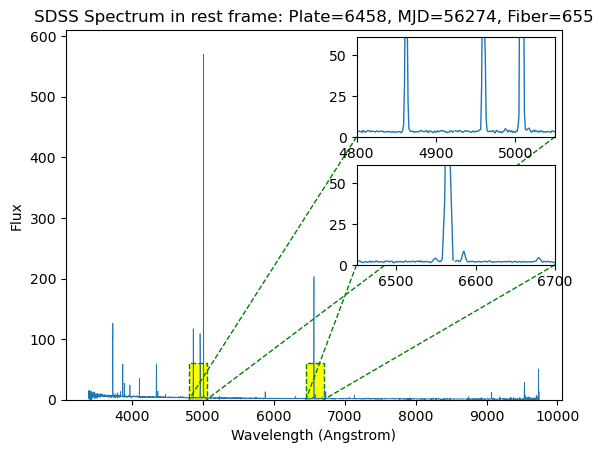

78
SDSS Spectrum: Plate=6479, MJD=56364, Fiber=245


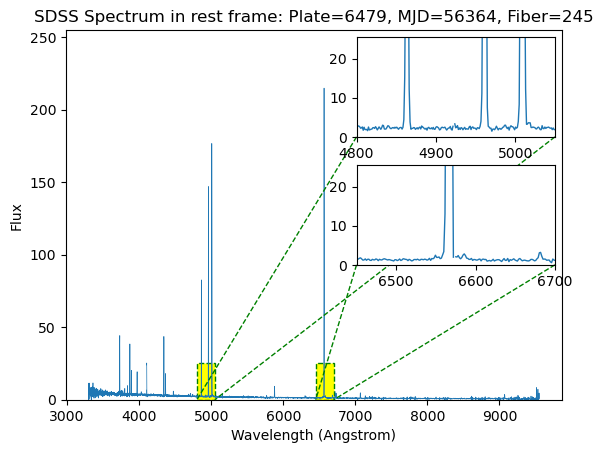

79
SDSS Spectrum: Plate=6641, MJD=56383, Fiber=398


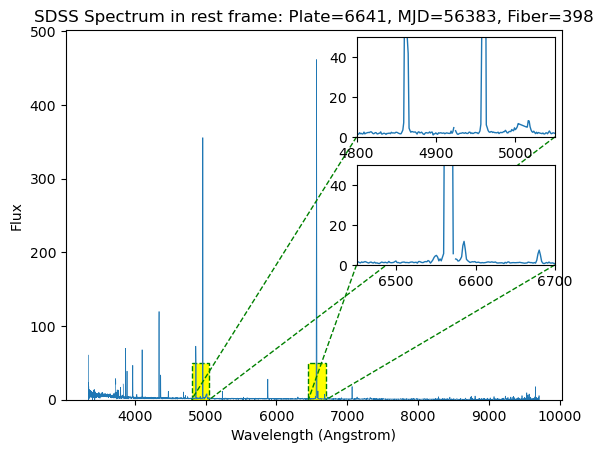

80
SDSS Spectrum: Plate=6656, MJD=56624, Fiber=622


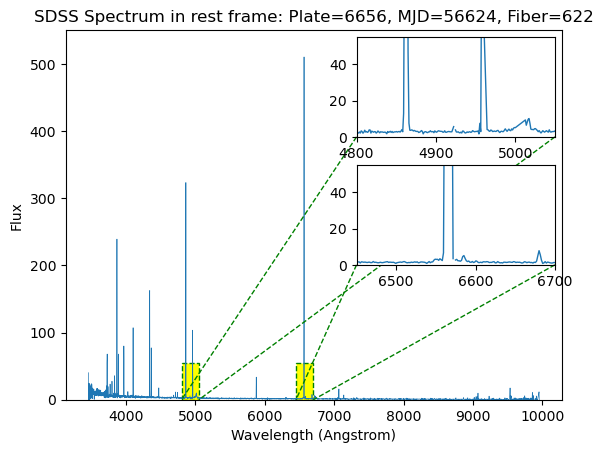

81
SDSS Spectrum: Plate=6671, MJD=56388, Fiber=724


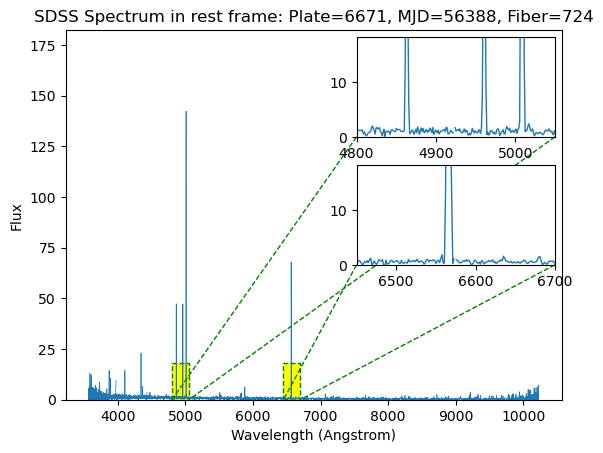

82
SDSS Spectrum: Plate=6685, MJD=56412, Fiber=919


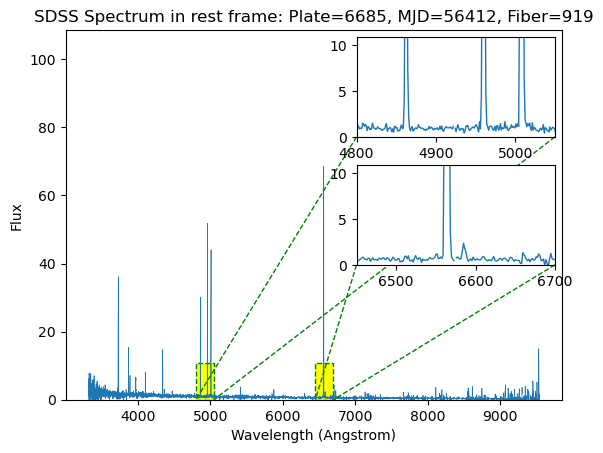

83
SDSS Spectrum: Plate=6691, MJD=56413, Fiber=461


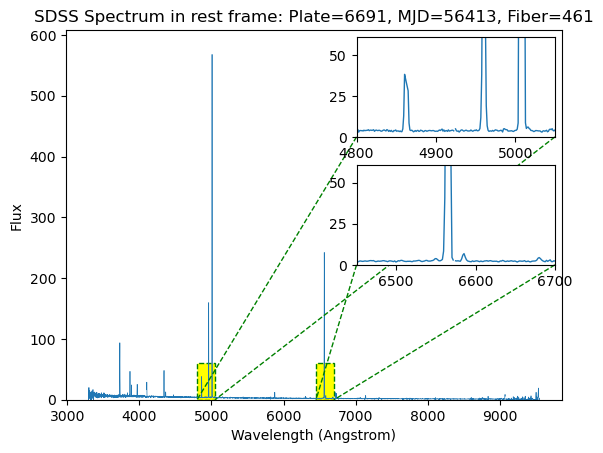

84
SDSS Spectrum: Plate=6706, MJD=56385, Fiber=307


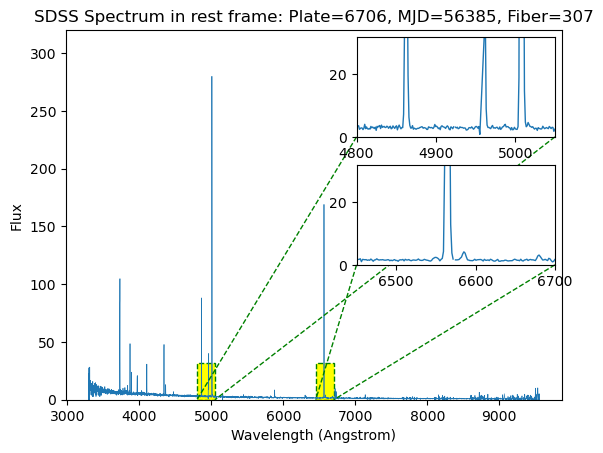

85
SDSS Spectrum: Plate=6716, MJD=56401, Fiber=835


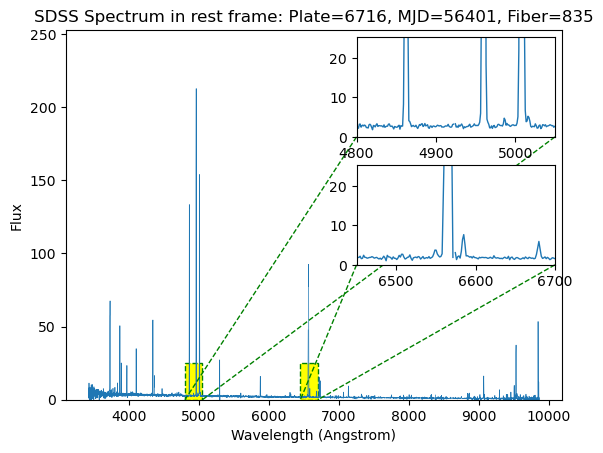

86
SDSS Spectrum: Plate=6790, MJD=56430, Fiber=85


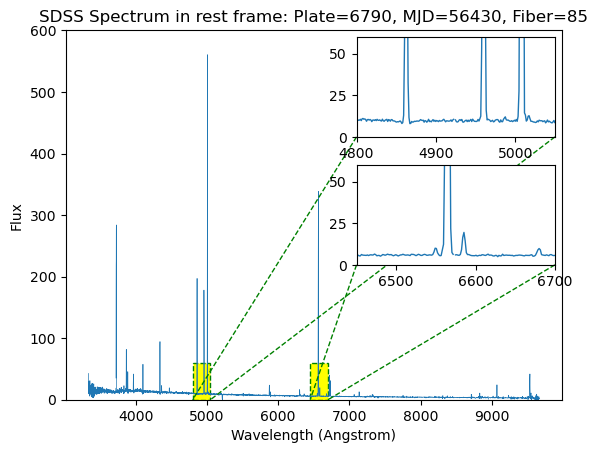

87
SDSS Spectrum: Plate=6838, MJD=56429, Fiber=251


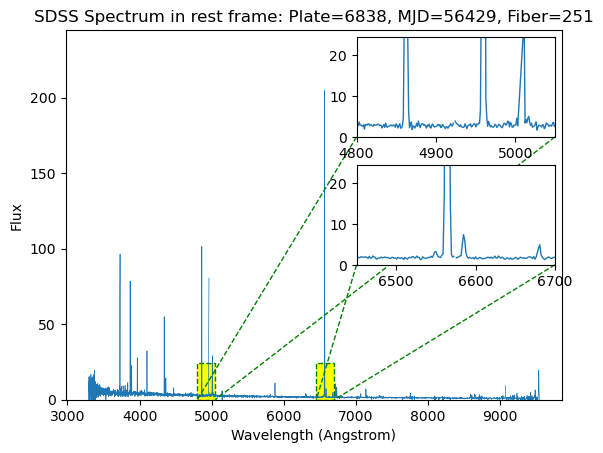

88
SDSS Spectrum: Plate=6976, MJD=56448, Fiber=597


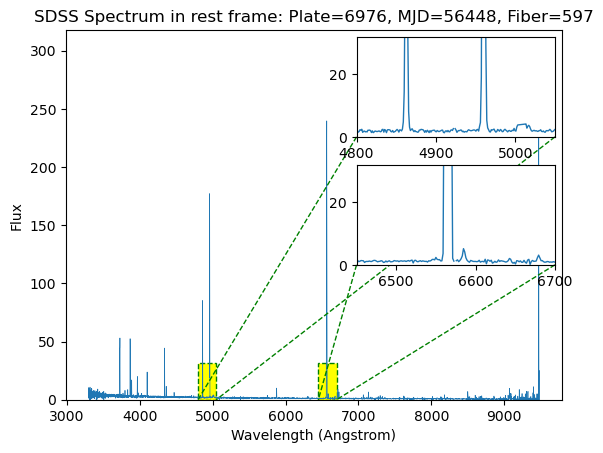

89
SDSS Spectrum: Plate=7034, MJD=56564, Fiber=919


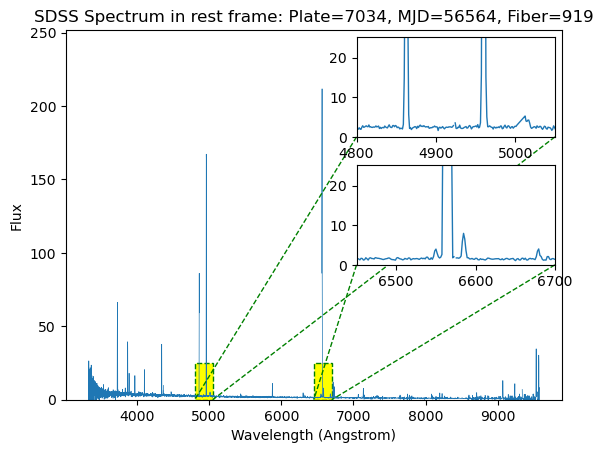

90
SDSS Spectrum: Plate=7091, MJD=56658, Fiber=324


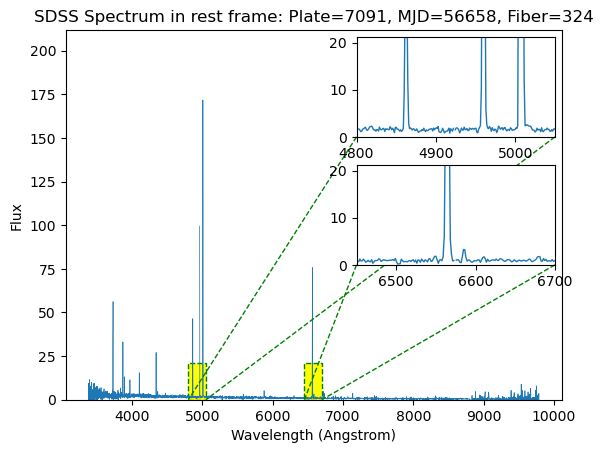

91
SDSS Spectrum: Plate=7100, MJD=56636, Fiber=932


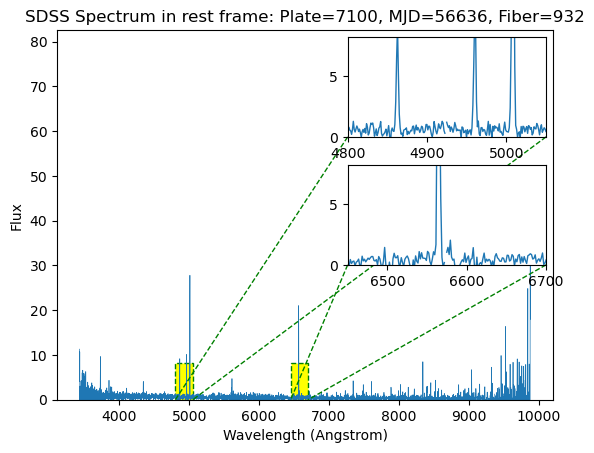

92
SDSS Spectrum: Plate=7149, MJD=56593, Fiber=912


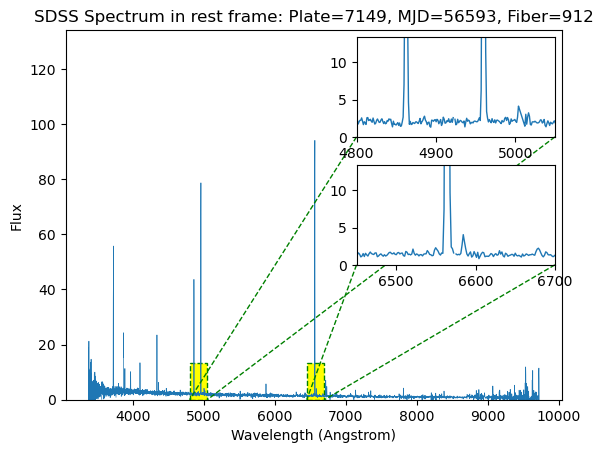

93
SDSS Spectrum: Plate=7316, MJD=56710, Fiber=349


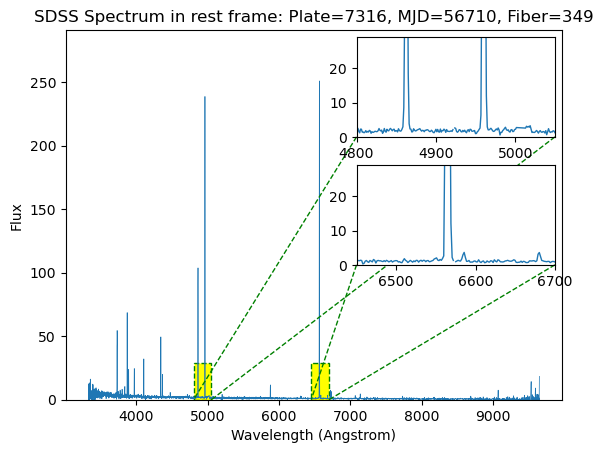

94
SDSS Spectrum: Plate=7377, MJD=56741, Fiber=386


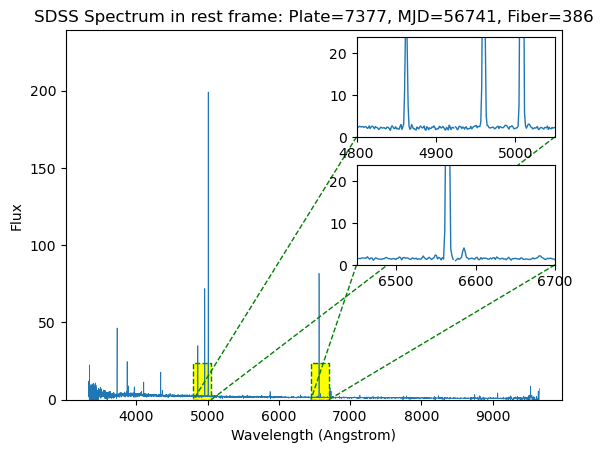

95
SDSS Spectrum: Plate=7404, MJD=56776, Fiber=446


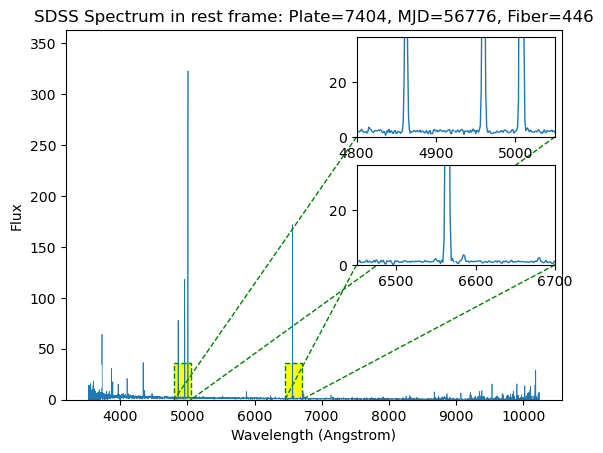

96
SDSS Spectrum: Plate=7572, MJD=56944, Fiber=383


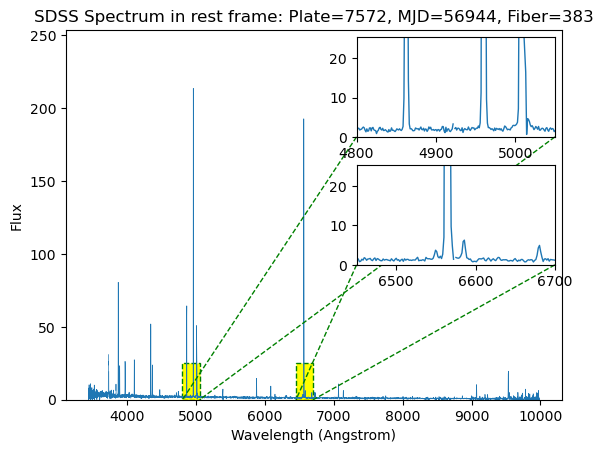

97
SDSS Spectrum: Plate=7645, MJD=57573, Fiber=747


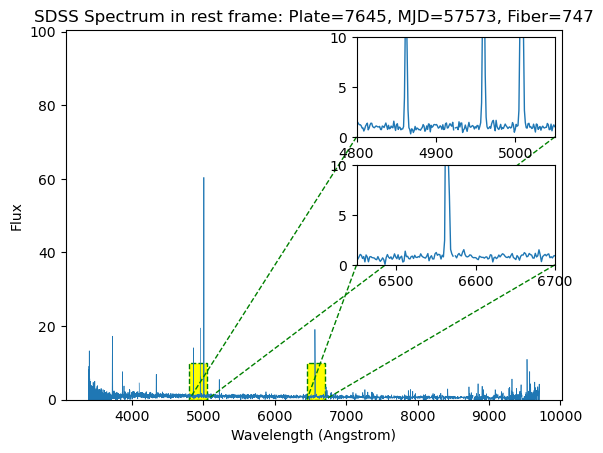

98
SDSS Spectrum: Plate=7653, MJD=57306, Fiber=686


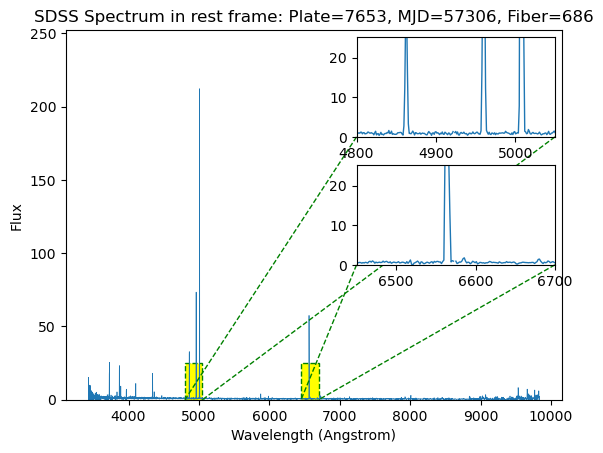

99
SDSS Spectrum: Plate=7717, MJD=58100, Fiber=29


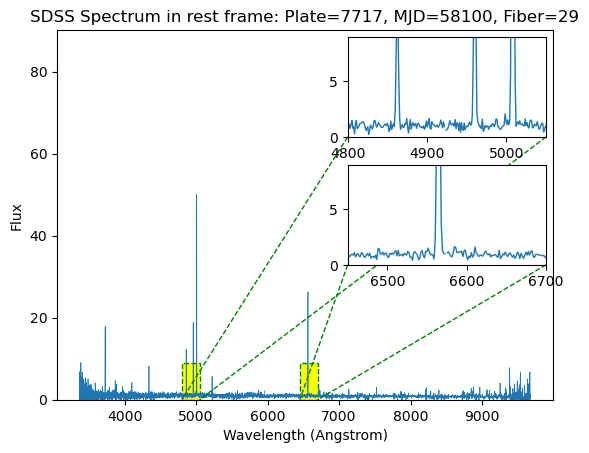

100
SDSS Spectrum: Plate=7822, MJD=57041, Fiber=278


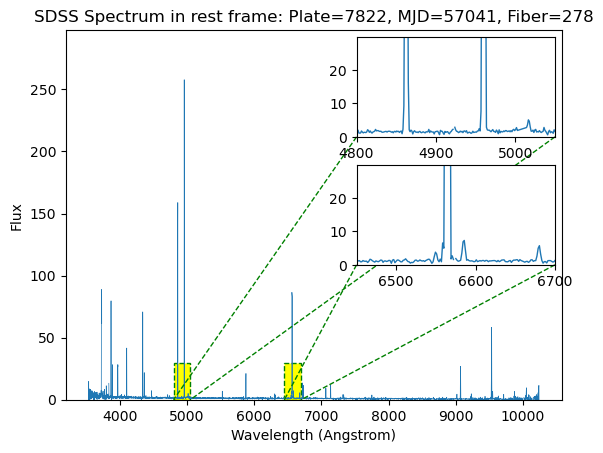

101
SDSS Spectrum: Plate=7879, MJD=57359, Fiber=682


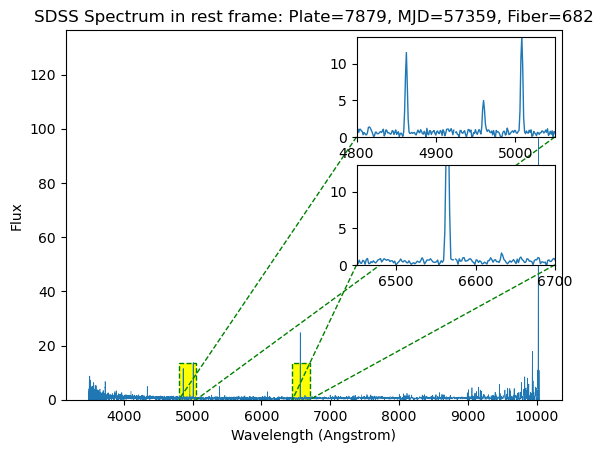

102
SDSS Spectrum: Plate=8059, MJD=57895, Fiber=836


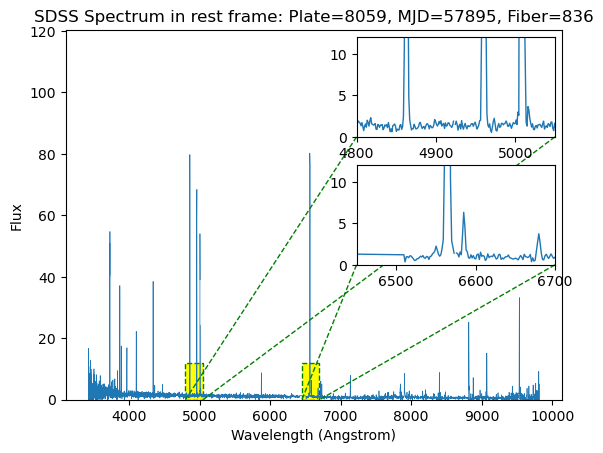

103
SDSS Spectrum: Plate=8184, MJD=57426, Fiber=122


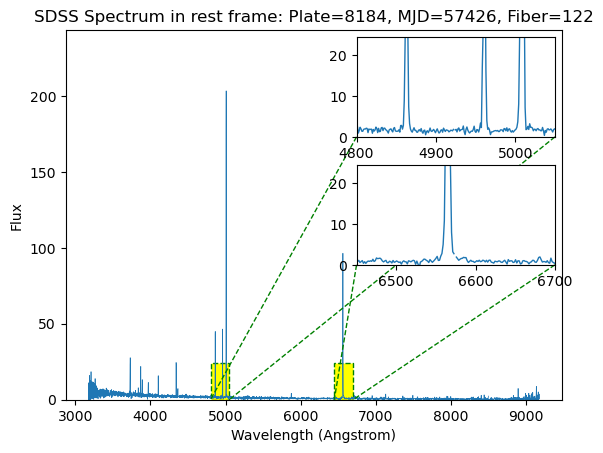

104
SDSS Spectrum: Plate=8189, MJD=57448, Fiber=884


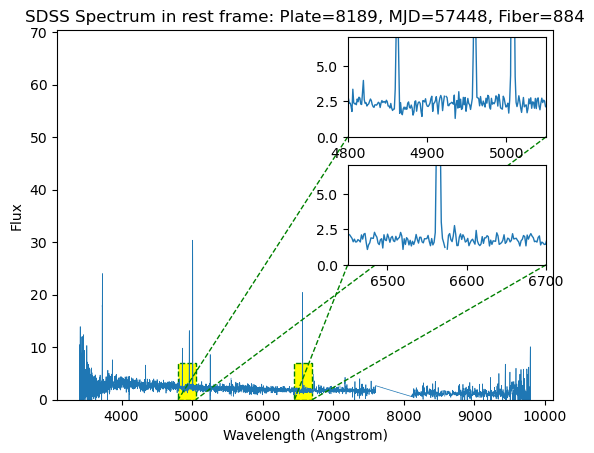

105
SDSS Spectrum: Plate=8197, MJD=57064, Fiber=634


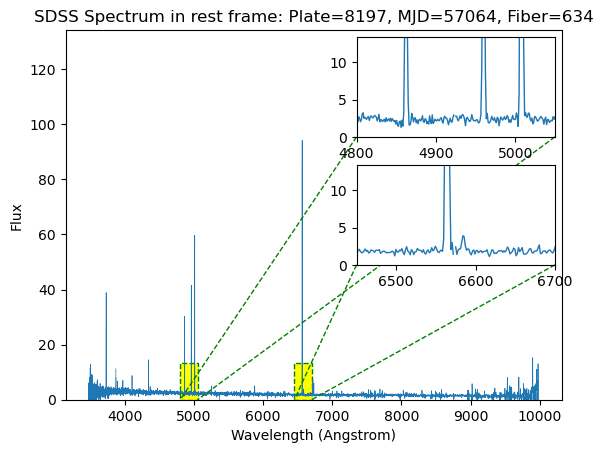

106
SDSS Spectrum: Plate=8200, MJD=58174, Fiber=987


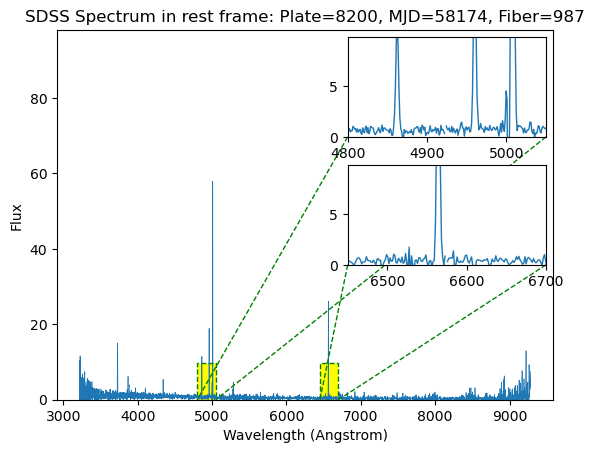

107
SDSS Spectrum: Plate=8208, MJD=57430, Fiber=244


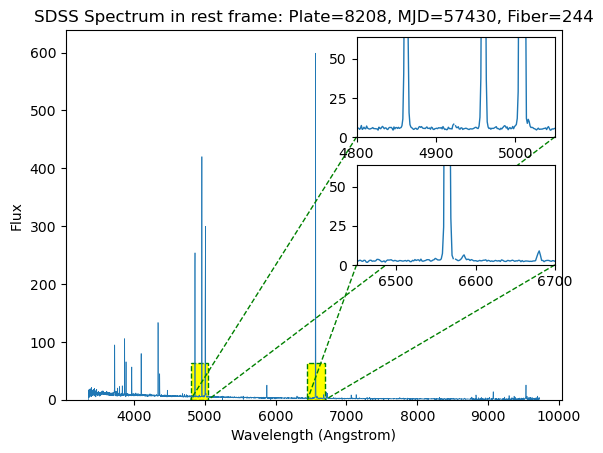

108
SDSS Spectrum: Plate=8235, MJD=58191, Fiber=149


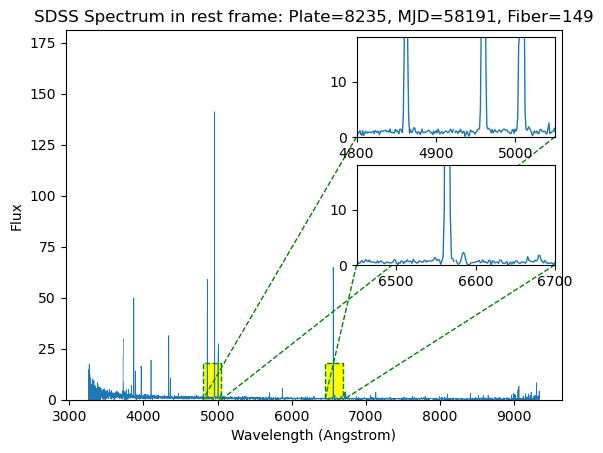

109
SDSS Spectrum: Plate=8302, MJD=57389, Fiber=747


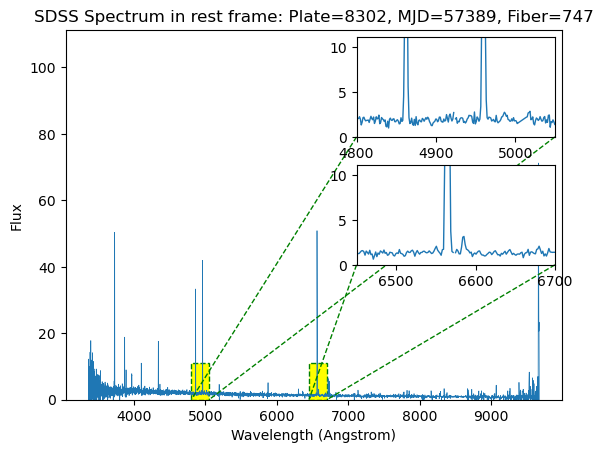

110
SDSS Spectrum: Plate=8388, MJD=57488, Fiber=60


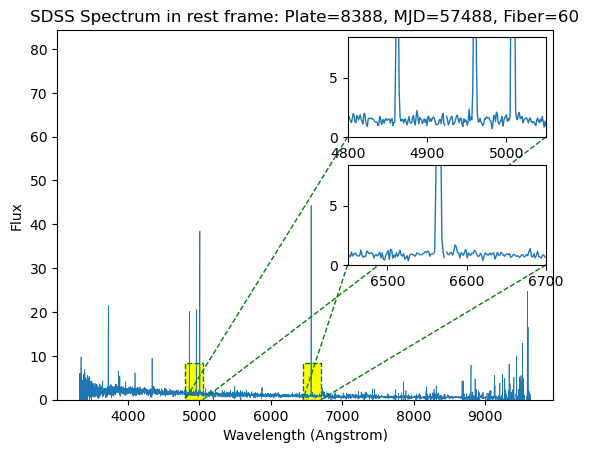

111
SDSS Spectrum: Plate=8419, MJD=58249, Fiber=25


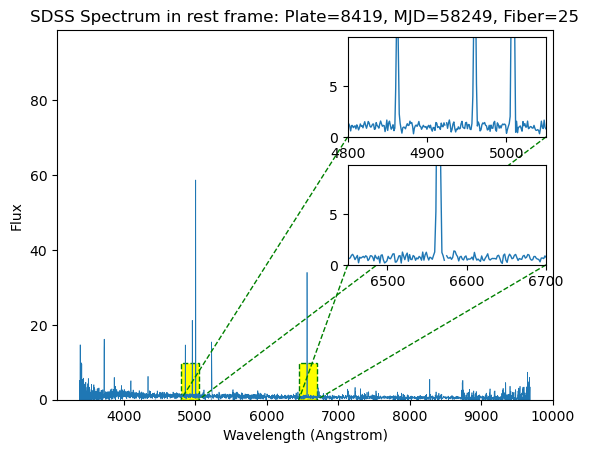

112
SDSS Spectrum: Plate=8426, MJD=58224, Fiber=192


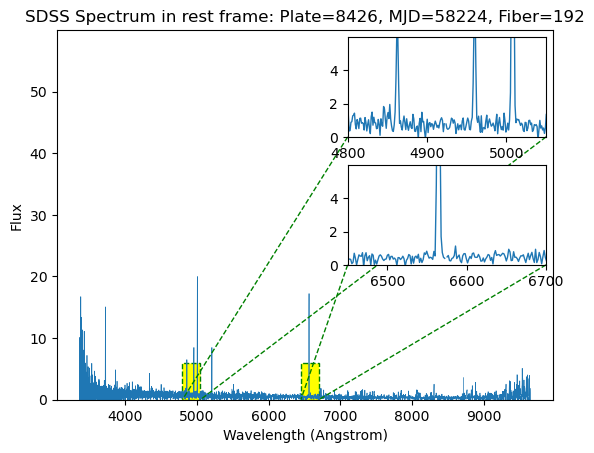

113
SDSS Spectrum: Plate=8500, MJD=57432, Fiber=828


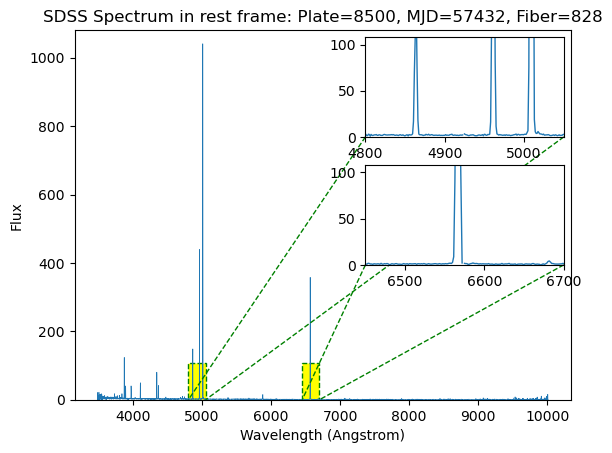

114
SDSS Spectrum: Plate=8529, MJD=58013, Fiber=615


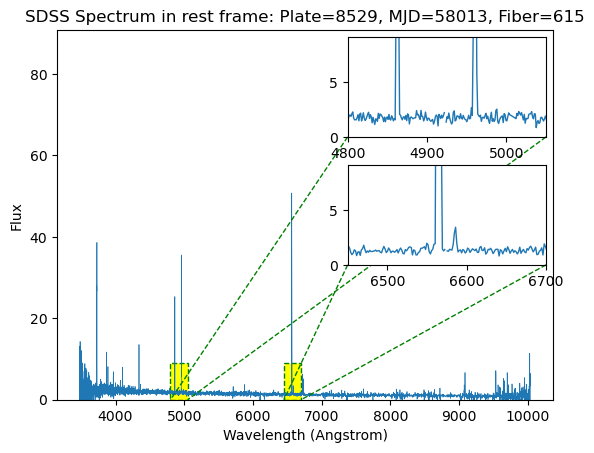

115
SDSS Spectrum: Plate=8762, MJD=57693, Fiber=432


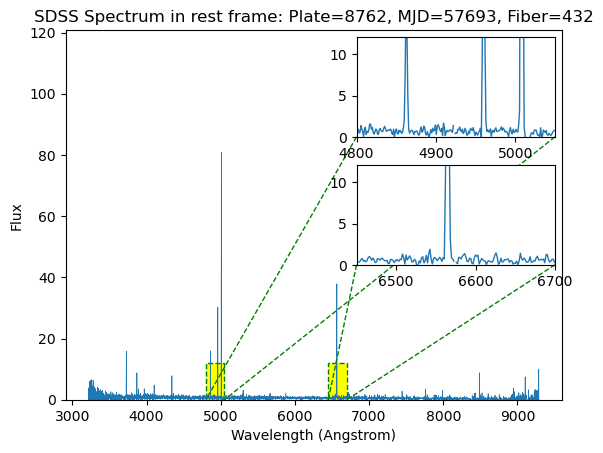

116
SDSS Spectrum: Plate=8856, MJD=57453, Fiber=808


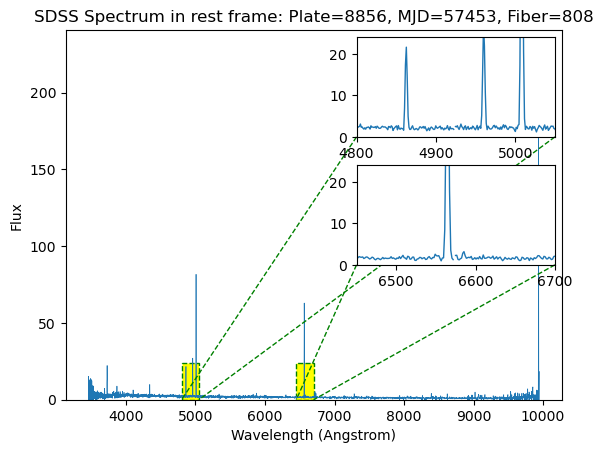

117
SDSS Spectrum: Plate=8870, MJD=57779, Fiber=409


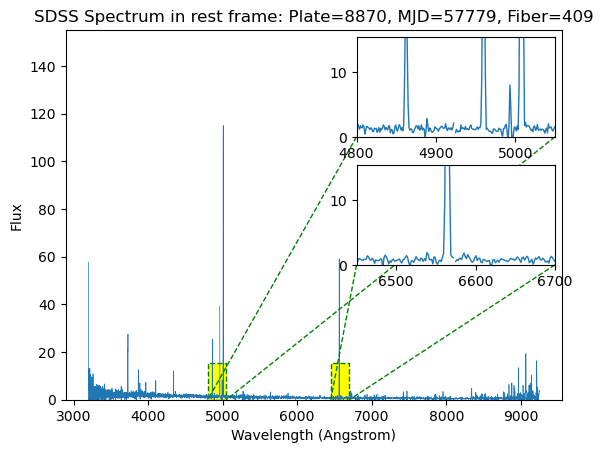

118
SDSS Spectrum: Plate=9166, MJD=58051, Fiber=633


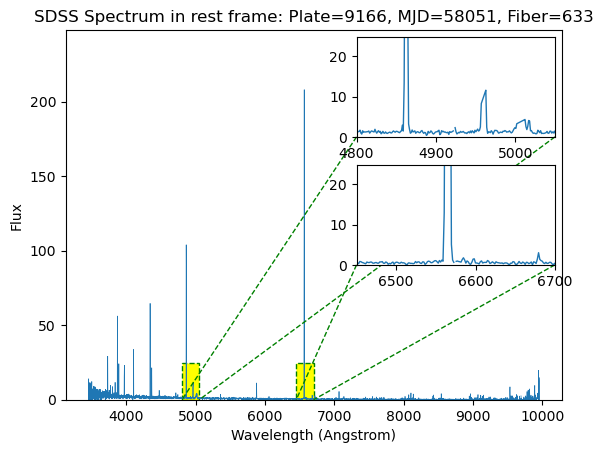

119
SDSS Spectrum: Plate=9325, MJD=58042, Fiber=137


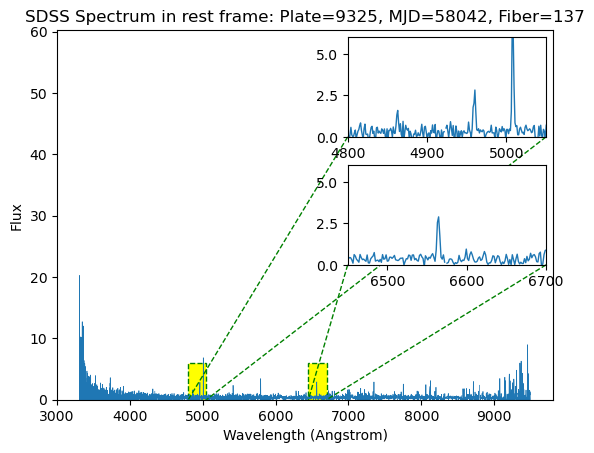

120
SDSS Spectrum: Plate=9329, MJD=57688, Fiber=759


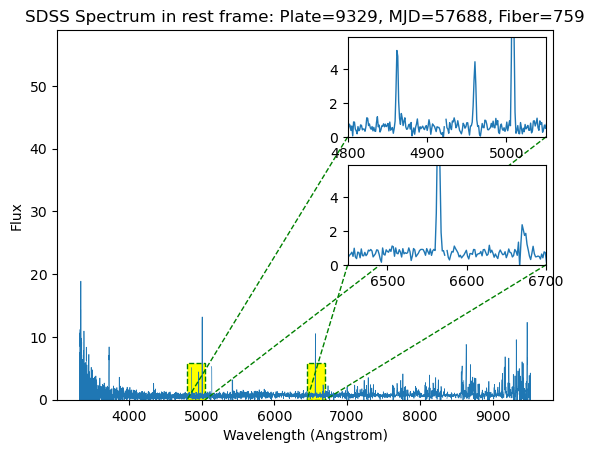

121
SDSS Spectrum: Plate=9390, MJD=58103, Fiber=329


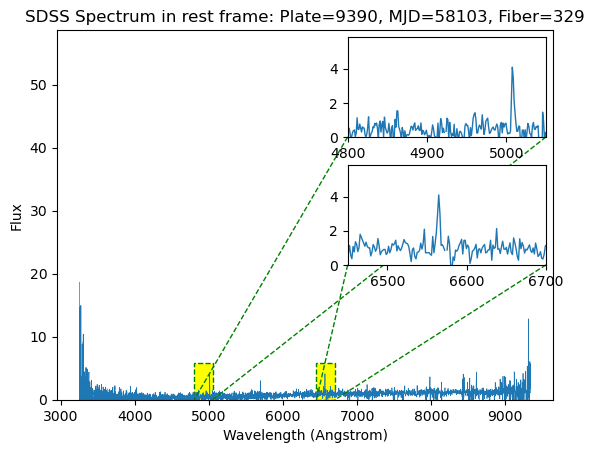

122
SDSS Spectrum: Plate=9408, MJD=58077, Fiber=931


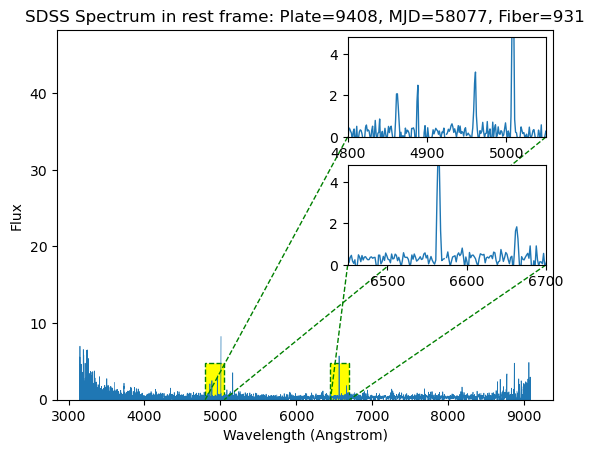

123
SDSS Spectrum: Plate=9415, MJD=58029, Fiber=683


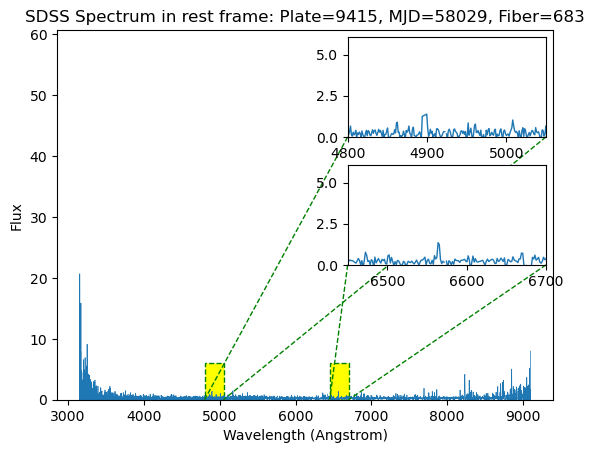

124
SDSS Spectrum: Plate=10233, MJD=58130, Fiber=852


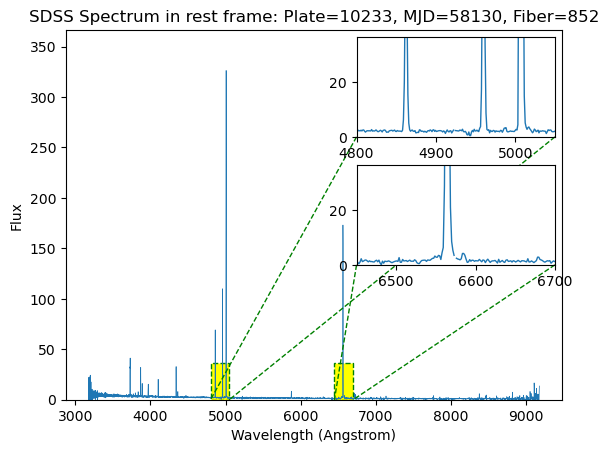

125
SDSS Spectrum: Plate=10293, MJD=58132, Fiber=310


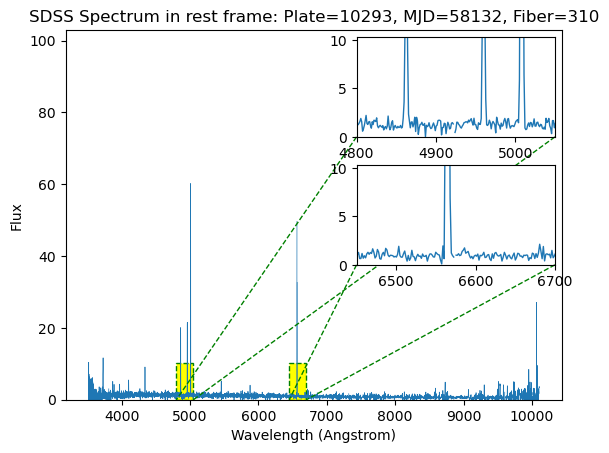

126
SDSS Spectrum: Plate=10473, MJD=58142, Fiber=158


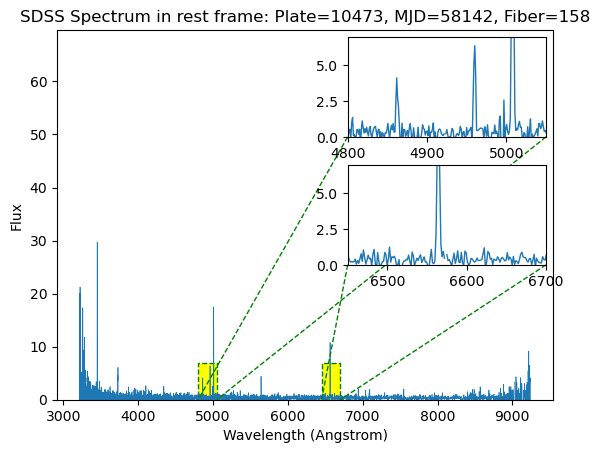

127
SDSS Spectrum: Plate=10733, MJD=58244, Fiber=245


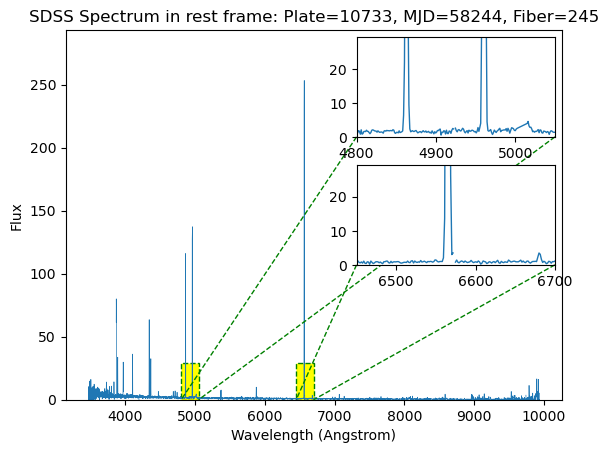

128
SDSS Spectrum: Plate=10759, MJD=58526, Fiber=857


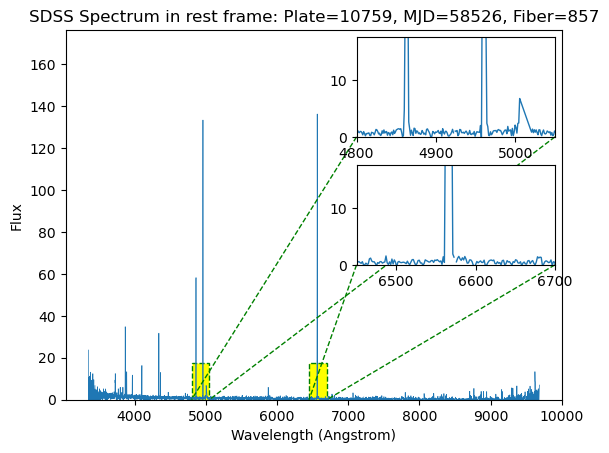

129
SDSS Spectrum: Plate=10759, MJD=58526, Fiber=998


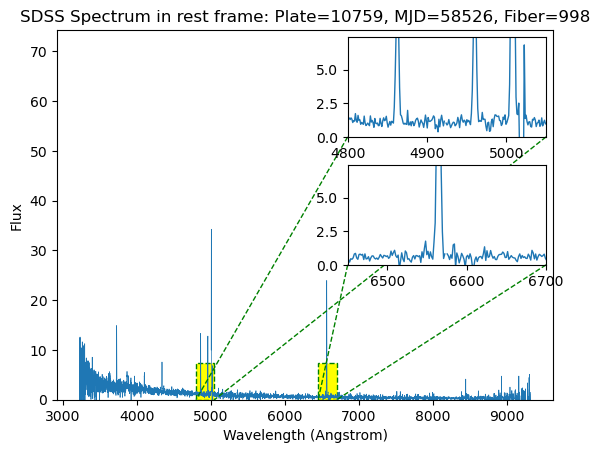

130
SDSS Spectrum: Plate=11055, MJD=58429, Fiber=972


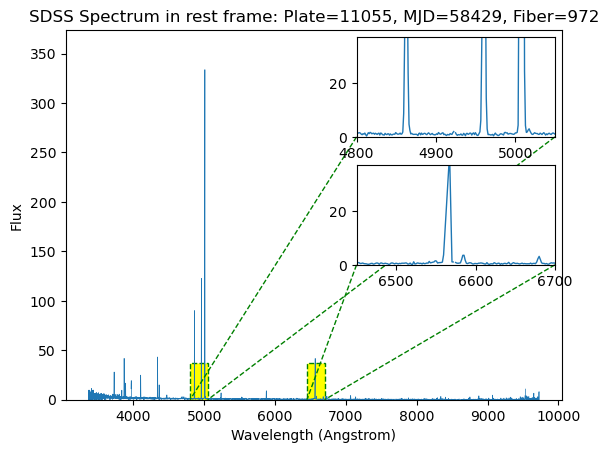

131
SDSS Spectrum: Plate=11067, MJD=58507, Fiber=597


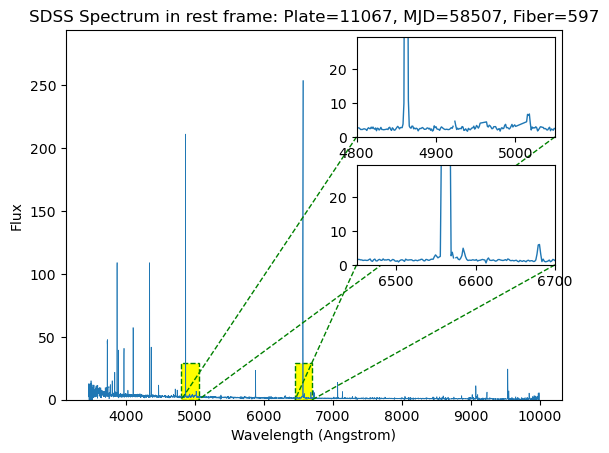

132
SDSS Spectrum: Plate=11075, MJD=58451, Fiber=713


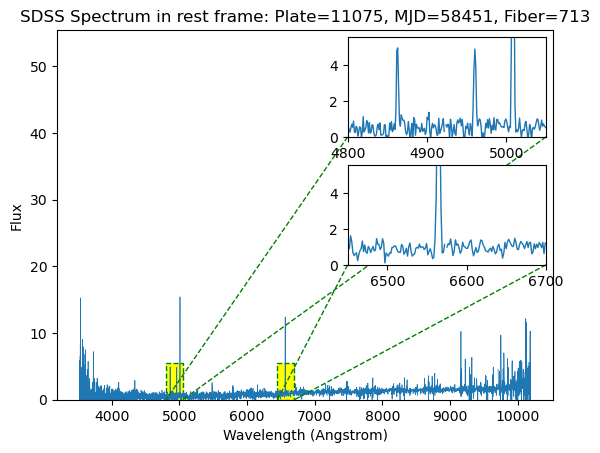

133
SDSS Spectrum: Plate=11112, MJD=58428, Fiber=906


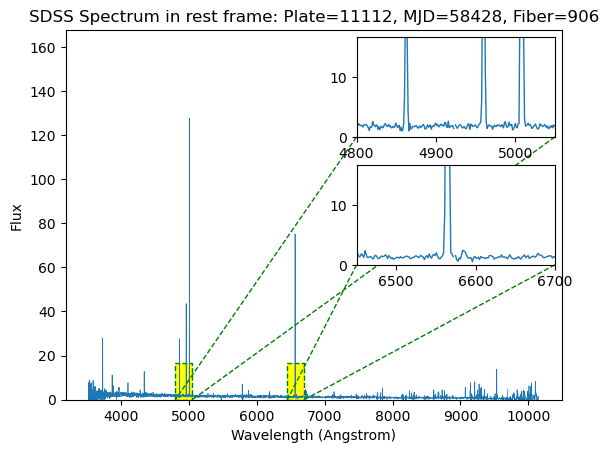

SDSS Spectrum: Plate=11113, MJD=58425, Fiber=168


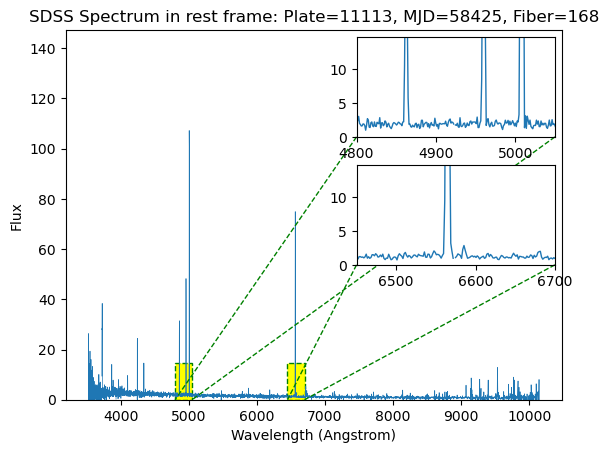

134
SDSS Spectrum: Plate=11112, MJD=58428, Fiber=906


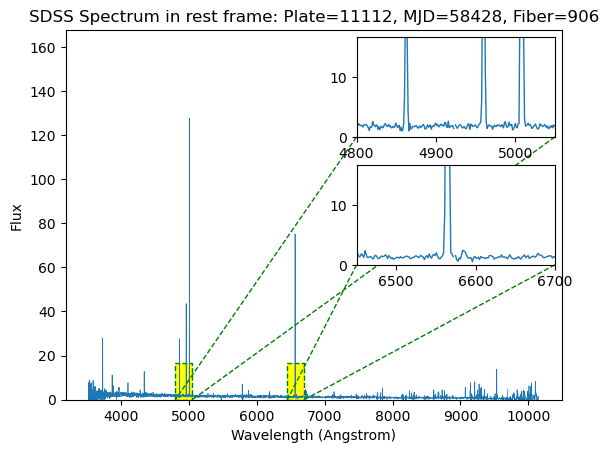

SDSS Spectrum: Plate=11113, MJD=58425, Fiber=168


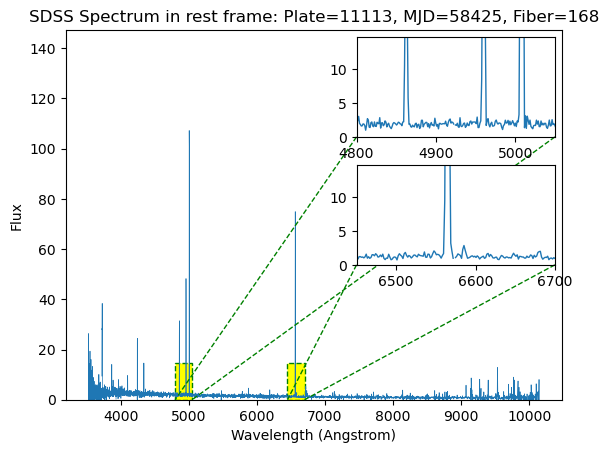

135
SDSS Spectrum: Plate=11288, MJD=58401, Fiber=544


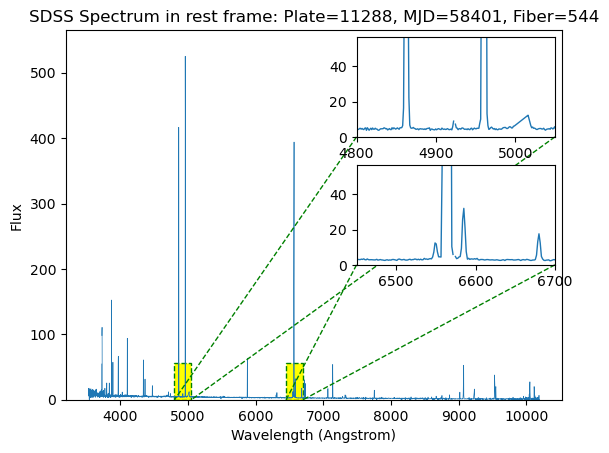

136
SDSS Spectrum: Plate=11294, MJD=58451, Fiber=619


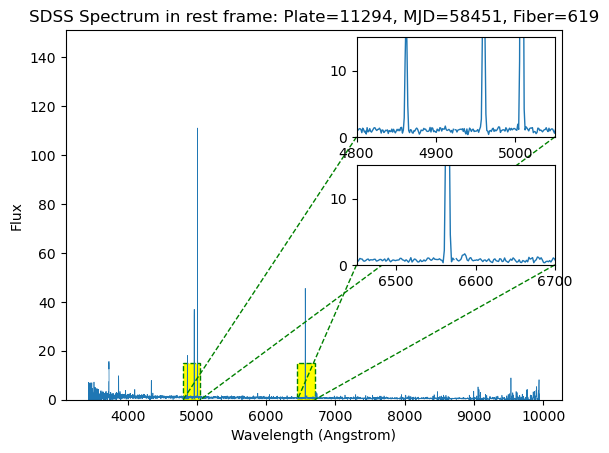

137
SDSS Spectrum: Plate=11385, MJD=58523, Fiber=874


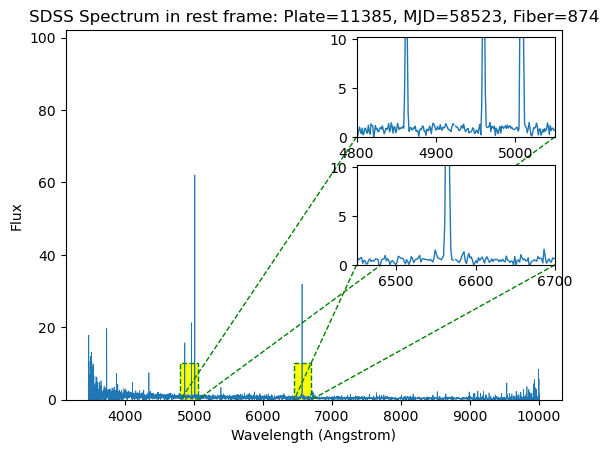

In [348]:
WISE_galaxy = []

for i in range(len(WISE_RA)):
    ra = WISE_RA[i]
    dec = WISE_DEC[i]
    error = 0.0000000001
    samp_gal = cut_gals[(abs(cut_gals['RA']-ra) <error) & (abs(cut_gals['DEC']-dec)<error)]
    print(i)
    for galaxy in samp_gal:
        WISE_galaxy.append(galaxy)
        plate = galaxy["PLATE"]
        mjd = galaxy["MJD"]
        fiber = galaxy["FIBER"]
        
        print(f"SDSS Spectrum: Plate={plate}, MJD={mjd}, Fiber={fiber}")
        
        
        sp = SDSS.get_spectra(plate=plate, mjd=mjd, fiberID=fiber)
        
        spec_hdu = sp[0]
        spec_data = spec_hdu[1].data
        
        z = spec_hdu[2].data["z"]
        
        header = spec_hdu[0].header
        
        loglam = spec_data['loglam']
        flux = spec_data['flux']
        wavelength = 10**loglam
        
        fig, ax = plt.subplots()
        
        #plot the spectrum
        plt.plot(wavelength/(1+z), flux, linewidth=0.5)
        plt.xlabel("Wavelength (Angstrom)")
        plt.ylabel("Flux")
        y_top = max(flux) + 40
        plt.ylim(0,y_top)
        plt.title(f"SDSS Spectrum in rest frame: Plate={plate}, MJD={mjd}, Fiber={fiber}")
    
        #inset plot
        inset1 = inset_axes(ax, width='40%', height='27%', loc='upper right',)
        inset1.plot(wavelength/(1+z), flux, linewidth=1)
        inset1.set_xlim(4800, 5050)
        inset1.set_ylim(0, y_top/10)
        mark_inset(ax, inset1, loc1=3, loc2=4, fc='yellow', ec='g', ls='--')
        
        #inset plot
        inset2 = inset_axes(ax, width='40%', height='27%', loc='center right',)
        inset2.plot(wavelength/(1+z), flux, linewidth=1)
        inset2.set_xlim(6450, 6700)
        inset2.set_ylim(0, y_top/10)
        mark_inset(ax, inset2, loc1=3, loc2=4, fc='yellow', ec='g', ls='--')
        
        plt.savefig(str(plate) + "-" + str(mjd)+ "-"+ str(fiber)+".jpeg")
        
        plt.show()

In [352]:
for i in range(int(len(WISE_galaxy)/2)):
    gal1 = WISE_galaxy[2*i]
    im1 = str(gal1["PLATE"]) + "-" + str(gal1["MJD"])+ "-"+ str(gal1["FIBER"])+".jpeg"
    gal2 = WISE_galaxy[2*i+1]
    im2 = str(gal2["PLATE"]) + "-" + str(gal2["MJD"])+ "-"+ str(gal2["FIBER"])+".jpeg"
    merge = merge_images(im1, im2)
    merge.save(str(i)+".jpeg")

pdf = FPDF()
# imagelist is the list with all image filenames
for i in range(int(len(WISE_galaxy)/2)):
    pdf.add_page()
    pdf.image(str(i)+".jpeg",w=pdf.epw,h=pdf.eph)
pdf.output("WISE_spectra.pdf")